<a href="https://colab.research.google.com/github/DataSciWithJoshua/Shallow-Neural-Networks/blob/main/Homework1_JJ_colab.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Project Name

## Setup

### Connecting to colab drive or local file system for persistent storage

In [6]:
try:
    # if this fails, we are not running in a colab environment
    from google.colab import drive
    exec_env = "colab"
except ImportError:
    exec_env = "local"


match exec_env:
    case "colab":
        print("Running in Google Colab")
        drive.mount('/content/drive')
        drive_path = "/content/drive/My Drive/"
    case "local":
        print("Running locally")
        drive_path = "" # make sure this is a local valid drive path
    case _:
        print("Unknown execution environment")


Running locally


### Helper Functions

In [296]:
import torch
def display_metadata(dataset, msg="", pad=25) -> None:
    if isinstance(dataset, torch.utils.data.Dataset):
        sample, _ = dataset[0]
        print(f'{msg.ljust(pad)} Dataset Shape: {dataset.data.shape}, Raw Min-Max: {dataset.data.min()}-{dataset.data.max()}, Min-Max: {sample.min().item():0.3f}-{sample.max().item():0.3f}')
    elif isinstance(dataset, torch.Tensor):
        print(f'{msg.ljust(pad)} Tensor Shape: {dataset.shape}, Min-Max: {dataset.min().item():0.3f}-{dataset.max().item():0.3f}')
    elif isinstance(dataset, list):
        print(f'{msg.ljust(pad)}   List Shape: {len(dataset)}, Min-Max: {min(dataset):0.3f}-{max(dataset):0.3f}')
    else:
        print(f"{msg.ljust(pad)} Unsupported type for metadata display: {type(dataset)}")

### Setup graphics processor if available

In [10]:
def device_setup() -> torch.DeviceObjType:
    if torch.cuda.is_available():
        device = torch.device("cuda")
        print("CUDA is available. Training on GPU.")
    
    elif torch.backends.mps.is_available():
        torch.backends.mps.benchmark = True
        device = torch.device("mps")
        print("MPS is available. Training with MPS.")
    
    else:
        device = torch.device("cpu")
        print("CUDA is not available. Training on CPU.")

    return device

## GAN Investigation

### Setup

In [108]:
import os
import random
import time
import pandas as pd
from collections import Counter
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from pathlib import Path
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler, random_split, Subset
from torch.nn.utils.rnn import pad_sequence
from torchvision.utils import make_grid
from torchinfo import summary
from PIL import Image

### Load Data

In [51]:
def get_fixed_samples_per_class(dataset: datasets, num_samples_per_class=10) -> Subset:

    class_indices = {}
    for idx, label in enumerate(dataset.targets):
        if label not in class_indices:
            class_indices[label] = []
        class_indices[label].append(idx)

    selected_indices = []
    for label, indices in class_indices.items():
        selected_indices.extend(random.sample(indices, num_samples_per_class))

    return Subset(dataset, selected_indices)

In [218]:
# Setup Dataloaders
batch_size = 150      
device = device_setup()

# Convert -1,1
transform = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
])

train_dataset = datasets.ImageFolder(root=r"fruits-360/Training", transform=transform)
test_dataset  = datasets.ImageFolder(root=r"fruits-360/Test", transform=transform)


# Reduce samples more for early experimenting
train_dataset = get_fixed_samples_per_class(train_dataset,num_samples_per_class=25)
test_dataset  = get_fixed_samples_per_class( test_dataset,num_samples_per_class=25)

# Split into train and validation sets
train_ratio = 0.8 
val_ratio   = 0.2 
total_samples = len(train_dataset)
train_size = int(train_ratio * total_samples)
val_size = total_samples - train_size
train_subset, val_subset = random_split(train_dataset, [train_size, val_size])


train_loader  = DataLoader(train_subset,  batch_size=batch_size, shuffle=True, pin_memory=True, num_workers=4, persistent_workers=True)
val_loader    = DataLoader(  val_subset,  batch_size=batch_size,shuffle=False, pin_memory=True, num_workers=4, persistent_workers=True)
test_loader   = DataLoader(test_dataset,  batch_size=batch_size,shuffle=False, pin_memory=True, num_workers=4, persistent_workers=True)

print(len(train_loader.dataset),len(val_loader.dataset),len(test_loader.dataset))

# Pre-allocated space on device - Significantly decreases train and test time if system memory allows
train_loader = [(data[0].to(device), data[1].to(device)) for data in train_loader]
val_loader   = [(data[0].to(device), data[1].to(device)) for data in val_loader]
test_loader  = [(data[0].to(device), data[1].to(device)) for data in test_loader]


MPS is available. Training with MPS.
2820 705 3525


In [220]:
num_classes = 141
class_to_idx = datasets.ImageFolder(root=r"fruits-360/Training", transform=transform).class_to_idx
idx_to_class = {v: k for k, v in class_to_idx.items()}
class_names = [idx_to_class[i] for i in range(num_classes)]

# Display size, range, and sample data
labels_list =[]
for _, (images, labels) in enumerate(train_loader):
    display_metadata(images,msg='images')
    display_metadata(labels,msg='labels')
    labels_list = labels.tolist()
    print(f"Class Id: {labels[0]} - Class Name: '{class_names[labels[0]]}'")
    break

images Tensor Shape: torch.Size([150, 3, 64, 64]), Min-Max: -1.00-1.00
labels Tensor Shape: torch.Size([150]), Min-Max: 0.00-140.00
Class Id: 38 - Class Name: 'Cocos 1'


### Define Networks

In [505]:
class DCGAN_Generator(nn.Module):
    def __init__(self, latent_dim, img_size, img_chan, conv_chan, kernels, strides, paddings):
        super().__init__()
        self.img_size=img_size
        self.img_chan=img_chan
        self.latent_dim = latent_dim
        layers_dim = [latent_dim] + conv_chan + [img_chan]
        print(f"DCGAN_Generator Layer Dim {layers_dim}")
        self.layers = nn.ModuleList([
            nn.Sequential(
                nn.ConvTranspose2d(layers_dim[i], 
                                   layers_dim[i + 1], 
                                   kernel_size=kernels, 
                                   stride=strides if i != len(layers_dim) - 2 else 4, 
                                   padding=paddings[i], 
                                   bias=False),
                # nn.ConvTranspose2d(layers_dim[i], layers_dim[i + 1], kernel_size=kernels[i], stride=strides[i], padding=paddings[i], bias=False),
                nn.BatchNorm2d(layers_dim[i + 1])   if i != len(layers_dim) - 2 else nn.Identity(),
                nn.ReLU()                           if i != len(layers_dim) - 2 else nn.Tanh(),
            )
            for i in range(len(layers_dim) - 1)
        ])

    def forward(self, z):
        batch_size = z.shape[0]
        z = z.view(z.size(0), self.latent_dim, 1, 1)
        for i,layer in enumerate(self.layers):
            # print(f"Gen Layer {i} output shape: {z.shape}")
            z=layer(z)
        z = z.reshape(batch_size, 3, 64, 64)
        return z


class DCGAN_Discriminator(nn.Module):
    def __init__(self, img_size, img_chan, conv_chan, kernels, strides, paddings):
        super().__init__()
        self.image_size=img_size
        layers_dim = [img_chan] + conv_chan + [1]
        print(f"DCGAN_Discriminator Layer Dim {layers_dim}")
        activation = nn.LeakyReLU(0.2)
        self.layers = nn.ModuleList([
            nn.Sequential(
                nn.Conv2d(layers_dim[i], layers_dim[i + 1], kernel_size=kernels[i], stride=strides, padding=paddings[i], bias=False),
                # nn.Conv2d(layers_dim[i], layers_dim[i + 1], kernel_size=kernels[i], stride=strides[i], padding=paddings[i], bias=False),
                nn.BatchNorm2d(layers_dim[i + 1])   if i != len(layers_dim) - 2 else nn.Identity(),
                activation                          if i != len(layers_dim) - 2 else nn.Identity(),
            )
            for i in range(len(layers_dim) - 1)
        ])

    def forward(self, x):
        for i,layer in enumerate(self.layers):
            # print(f"Disc Layer {i} output shape: {x.shape}")
            x = layer(x)
        x = x.view(x.size(0), -1)
        return x
    


class Gen_CGAN_FC(nn.Module):
    def __init__(self):
        super(Gen_CGAN_FC, self).__init__()
        self.generator = nn.Sequential(
            nn.Linear( 241, 400), nn.ReLU(), # latent dim + num_classes
            nn.Linear( 400, 800), nn.ReLU(),
            nn.Linear( 800,1600), nn.Tanh(),
            nn.Linear(1600,4096), nn.Tanh(), # flattened img*img
        )

    def forward(self, x):
        display_metadata(x, msg='gen x:')
        return self.generator(x)
    

class Disc_CGAN_FC(nn.Module):
    def __init__(self, dropout=0.2):
        super(Disc_CGAN_FC, self).__init__()
        self.discriminator = nn.Sequential(
            nn.Linear(4237,1600), nn.ReLU(), nn.Dropout(dropout), # flattened img*img + num_classes
            nn.Linear(1600, 800), nn.ReLU(), nn.Dropout(dropout),
            nn.Linear( 800, 400), nn.ReLU(), nn.Dropout(dropout),
            nn.Linear( 400, 100), nn.ReLU(), nn.Dropout(dropout),
            nn.Linear( 100,   1), nn.Sigmoid()         
        )
    
    def forward(self, x):
        display_metadata(x, msg='disc x:')
        return self.discriminator(x)


class Gen_CGAN_CNN(nn.Module):
    def __init__(self, latent_dim, num_classes=141, channels=3, img_size=64):
        super(Gen_CGAN_CNN, self).__init__()
        self.img_size = img_size
        self.latent_dim = latent_dim
        self.num_classes = num_classes
        self.img_size = img_size
        self.fc = nn.Linear(latent_dim + num_classes, 1024)

        self.gen = nn.Sequential(
                nn.ConvTranspose2d(1024, 512,   kernel_size=4, stride=1, padding=0),
                nn.BatchNorm2d(512),
                nn.ReLU(True),
                
                nn.ConvTranspose2d(512, 256,    kernel_size=4, stride=2, padding=1),
                nn.BatchNorm2d(256),
                nn.ReLU(True),
                
                nn.ConvTranspose2d(256, 128,     kernel_size=4, stride=2, padding=1),
                nn.BatchNorm2d(128),
                nn.ReLU(True),

                nn.ConvTranspose2d(128,  64,     kernel_size=4, stride=2, padding=1),
                nn.BatchNorm2d(64),
                nn.ReLU(True),
                
                nn.ConvTranspose2d(64, channels, kernel_size=4, stride=2, padding=1),
                nn.Tanh(),  # Output [-1, 1]
        )

    def forward(self, z, labels):
        # Combine latent vector and label embedding
        labels = nn.functional.one_hot(labels, self.num_classes).float()
        x = torch.cat([z, labels], dim=1)
        x = self.fc(x)
        x = x.view(x.size(0), 1024, 1, 1)  # Reshape for transposed ConvTranspose2d layers
        return self.gen(x)


class Disc_CGAN_CNN(nn.Module):
    def __init__(self, dropout=0.2, num_classes=141, channels=3, img_size=64):
        super(Disc_CGAN_CNN, self).__init__()
        self.img_size = img_size
        self.disc = nn.Sequential(
            nn.Conv2d(channels+1, 128, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(dropout),
            
            nn.Conv2d(      128,  256, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(dropout),
            
            nn.Conv2d(      256,  512, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(dropout),
            
            nn.Conv2d(      512,    1, kernel_size=4, stride=1, padding=0),
            nn.Sigmoid(),  # Output [0,1]
        )
        self.global_pool = nn.AdaptiveAvgPool2d((1, 1))
    
    def forward(self, x):
        # for i, layer in enumerate(self.disc):
        #     x = layer(x)
        #     print(f"Shape after layer {i}: {x.shape}")
        x = self.disc(x)    
        x = self.global_pool(x)
        x = x.view(x.size(0), -1)
        return x

### Define Training Loop

In [524]:
# Generate class-balanced inputs for the generator
def generate_generator_input(generator, batch_size, latent_dim, device):
    with torch.inference_mode():
        z = torch.randn(batch_size, latent_dim, device=device)
        fake_images = generator(z).detach().to(device)
        return fake_images
    

def generate_generator_input_fc(batch_size, num_classes, latent_dim, device):
    # samples_per_class = batch_size // num_classes
    z = torch.randn(batch_size, latent_dim, device=device)
    labels = torch.randint(0, num_classes, (batch_size,), device=device)
    one_hot_labels = torch.nn.functional.one_hot(labels, num_classes=num_classes).float()
    # # Ensure dimensions match
    # if one_hot_labels.shape[0] != batch_size or one_hot_labels.shape[1] != num_classes:
    #     raise ValueError(
    #         f"Mismatch in one_hot_labels dimensions: expected ({batch_size}, {num_classes}), "
    #         f"got {one_hot_labels.shape}")
    z, one_hot_labels = z.to(device), one_hot_labels.to(device)
    gen_input_data = torch.cat([z, one_hot_labels], dim=1).to(device)

    return gen_input_data, one_hot_labels
   

def reverse_transform(tensor, mean=None, std=None, target_size=None):
    if mean is None:
        mean = [0.5, 0.5, 0.5]
    if std is None:
        std = [0.5, 0.5, 0.5]
        
    # Avoid modifying the original
    tensor = tensor.clone().detach()
    
    # # Reverse normalization
    # for t, m, s in zip(tensor, mean, std):
    #     t = t * s + m  # Out-of-place operation

    # Reverse normalization
    for t, m, s in zip(tensor, mean, std):
        t.mul_(s).add_(m)  # In-place operation corrected
    
    # Ensure values are in [0, 1] range
    tensor = torch.clamp(tensor, 0, 1)
    
    pil_image = transforms.functional.to_pil_image(tensor)
    
    # Resize if target_size is provided
    if target_size:
        pil_image = pil_image.resize(target_size, resample=Image.BILINEAR)
    
    return pil_image


def plot_image(image, label=None):
    if image.size(0) == 4:
        image = image[:3,:,:]
    assert image.size(0) == 3, f'channel dimension not correct {image.size(0)}'
    if label is None:
        title = "unlabeled"
    else:
        title = f'Label ({label.item()}): {idx_to_class[label.item()]}'
    display_metadata(image,msg=title)
    real_image_t = reverse_transform(image, target_size=(100,100))
    plt.imshow(real_image_t)  
    plt.axis('off')
    plt.title(title)
    plt.show()  


In [ ]:
def train_fc_gan(generator, discriminator, gen_opt, disc_opt, loss_func, train_loader, latent_dim, device, num_epochs):
    
    start_time = time.time()
    train_loss_gen = []
    train_loss_disc = []
    train_acc_real = []
    train_acc_fake = []



    for epoch in range(num_epochs):
        epoch_start_time = time.time()
        running_loss_gen = 0.0
        running_loss_disc = 0.0
        correct_real = 0
        correct_fake = 0
        total_real = 0
        total_fake = 0
        total_samples = 0

        generator.train()
        discriminator.train()

        for i, (real_images, labels) in enumerate(train_loader):
            batch_start_time = time.time()

            batch_size = real_images.size(0)
            real_labels = torch.ones( (batch_size, 1), device=device)
            fake_labels = torch.zeros((batch_size, 1), device=device)

            ##############################
            ### Discriminator Training ###
            ##############################
            
            #  Collect Real Data
            display_metadata(real_images, msg="real_images1") # [batch_size, channel, height, width]
            real_images = real_images.view(real_images.size(0), -1).to(device)
            real_images = (real_images - 0.5) / 0.5 # normalize to [-1, 1]
            display_metadata(real_images, msg="real_images2") # [batch_size, channel, height, width]
            one_hot_labels = torch.nn.functional.one_hot(labels, num_classes=10).float().to(device)
            real_images_with_labels = torch.cat([real_images, one_hot_labels], dim=1)
            display_metadata(real_images_with_labels, msg="real_images_with_labels")

            # Generate Fake Data
            gen_input_data, fake_labels = generate_generator_input_fc(batch_size, num_classes, latent_dim, device)
            with torch.inference_mode():
                fake_images = generator(gen_input_data)
            # fake_images_with_labels = torch.cat([fake_images, fake_labels], dim=1)
            fake_labels_expanded = fake_labels.unsqueeze(-1).unsqueeze(-1)  # [batch_size, num_classes, 1, 1]
            fake_labels_expanded = fake_labels_expanded.expand(-1, -1, fake_images.size(2), fake_images.size(3))  # [batch_size, num_classes, height, width]
            fake_labels_expanded = fake_labels_expanded.mean(dim=1, keepdim=True)  # [batch_size, 1, height, width]
            fake_images_with_labels = torch.cat([fake_images, fake_labels_expanded], dim=1)  # [batch_size, 4, height, width]

            # Combine real and fake images, then shuffle
            combined_data   = torch.cat([real_images_with_labels, fake_images_with_labels], dim=0)
            combined_labels = torch.cat([real_labels            , fake_labels            ], dim=0)
            perm = torch.randperm(2 * batch_size)
            combined_data, combined_labels = combined_data[perm], combined_labels[perm]


            disc_train_start = time.time()
            # Discriminator Forward Pass - Individually pass real and fake
            predictions = discriminator(combined_data)
            disc_loss = loss_func(predictions, combined_labels)
            running_loss_disc += disc_loss.item()

            # Back-propagation
            disc_opt.zero_grad()
            disc_loss.backward()
            disc_opt.step()

            # Calculate accuracy
            real_predictions = discriminator(real_images_with_labels)
            fake_predictions = discriminator(fake_images_with_labels)
            correct_real += (real_predictions >= 0.5).sum().item()
            correct_fake += (fake_predictions <  0.5).sum().item()
            total_real += real_predictions.size(0)
            total_fake += fake_predictions.size(0)
            total_samples += batch_size

            ##############################
            ### Generator Training #######
            ##############################
            gen_train_start = time.time()

            # Generator Forward Pass
            gen_input_data, fake_labels = generate_generator_input_fc(batch_size, num_classes, latent_dim, device)
            with torch.inference_mode():
                fake_images = generator(gen_input_data)
            # fake_images_with_labels = torch.cat([fake_images, fake_labels], dim=1)
            fake_labels_expanded = fake_labels.unsqueeze(-1).unsqueeze(-1)  # [batch_size, num_classes, 1, 1]
            fake_labels_expanded = fake_labels_expanded.expand(-1, -1, fake_images.size(2), fake_images.size(3))  # [batch_size, num_classes, height, width]
            fake_labels_expanded = fake_labels_expanded.mean(dim=1, keepdim=True)  # [batch_size, 1, height, width]
            fake_images_with_labels = torch.cat([fake_images, fake_labels_expanded], dim=1)  # [batch_size, 4, height, width]

            predictions  = discriminator(fake_images_with_labels)
            gen_loss = loss_func(predictions, real_labels)
            running_loss_gen += gen_loss.item()
            
            # Back-propagation
            gen_opt.zero_grad()
            gen_loss.backward()
            gen_opt.step()

            if i % 20==0:
                print(f"Data Collect: {(disc_train_start - batch_start_time):.2f}s \
                    Disc Time: {(gen_train_start - disc_train_start):.2f}s \
                    Gen Time: {(time.time() - gen_train_start):.2f}s")
                
                real_image = real_images[0]
                real_image_t = reverse_transform(real_image, target_size=(100,100))
                plt.imshow(real_image_t)  
                plt.axis('off')
                plt.show()  

                fake_image = fake_images[0]
                fake_image_t = reverse_transform(fake_image, target_size=(100,100))
                plt.imshow(fake_image_t)  
                plt.axis('off')
                plt.show()  
                
            # assert False, 'end'


        # Compute and display metrics
        avg_loss_gen  = running_loss_gen  / len(train_loader)
        avg_loss_disc = running_loss_disc / len(train_loader)
        acc_real = correct_real / total_samples
        acc_fake = correct_fake / total_samples

        train_loss_gen.append(avg_loss_gen)
        train_loss_disc.append(avg_loss_disc)
        train_acc_real.append(acc_real)
        train_acc_fake.append(acc_fake)

        epoch_time = time.time() - epoch_start_time

        print(f"Epoch [{epoch + 1}/{num_epochs}], \
                DiscLoss: {avg_loss_disc:.4f}, \
                GenLoss: {avg_loss_gen:.4f}, \
                RealAcc: {acc_real:.2f}, \
                FakeAcc: {acc_fake:.2f}, \
                Epoch Time: {epoch_time:.2f}")
        
    print(f"Total Training Time: {(time.time() - start_time):.2f}s")
    return train_loss_gen, train_loss_disc, train_acc_real, train_acc_fake, generator, discriminator


def train_cnn_gan(generator, discriminator, gen_opt, disc_opt, loss_func, train_loader, latent_dim, device, num_epochs):
    start_time = time.time()
    train_loss_gen = []
    train_loss_disc = []
    train_acc_real = []
    train_acc_fake = []
    sample=0
    debug_interval = 20

    for epoch in range(num_epochs):
        epoch_start_time = time.time()
        running_loss_gen = 0.0
        running_loss_disc = 0.0
        correct_real = 0
        correct_fake = 0
        total_samples = 0

        generator.train()
        discriminator.train()

        for batch_idx, (real_images, labels) in enumerate(train_loader):

            #######################################
            #####       Data Preparation      #####
            #######################################
            batch_start_time = time.time()
            batch_size = real_images.size(0)
           
            # Generate fake data
            z = torch.randn(batch_size, latent_dim).to(device)
            gen_labels = torch.randint(0, num_classes, (batch_size,)).to(device)
            with torch.inference_mode():
                fake_images = generator(z, gen_labels)

            fake_labels = (2*(gen_labels / (num_classes - 1))-1).view(-1, 1, 1, 1).expand(-1, 1, 64, 64)
            fake_images_with_labels = torch.cat([fake_images, fake_labels], dim=1)


            # Prepare real data
            real_labels = (2*(labels / (num_classes - 1))-1).view(-1, 1, 1, 1).expand(-1, 1, 64, 64)
            real_images_with_labels = torch.cat([real_images, real_labels], dim=1)
            
            # Combine real and fake images to shuffle for discriminator
            combined_data   = torch.cat([                   real_images_with_labels,                     fake_images_with_labels], dim=0) 
            combined_labels = torch.cat([torch.ones((batch_size, 1), device=device), torch.zeros((batch_size, 1), device=device)], dim=0)
            combined_embed  = torch.cat([                                    labels,                                  gen_labels], dim=0)
            perm = torch.randperm(2 * batch_size)
            combined_data, combined_labels = combined_data[perm], combined_labels[perm]


            #######################################
            #####    Discriminator Training   #####
            #######################################
            disc_train_start = time.time()

            # Discriminator Forward Pass
            predictions = discriminator(combined_data)
            disc_loss = loss_func(predictions, combined_labels)
            running_loss_disc += disc_loss.item()

            # Discriminator Backward Pass
            disc_opt.zero_grad()
            disc_loss.backward()
            disc_opt.step()

            # Calculate accuracy
            with torch.inference_mode():
                real_predictions = discriminator(real_images_with_labels)
                fake_predictions = discriminator(fake_images_with_labels)
            correct_real += (real_predictions >= 0.5).sum().item()
            correct_fake += (fake_predictions <  0.5).sum().item()
            total_samples += batch_size
            
            if (batch_idx % debug_interval)==0: 
                print(f'Expected: {"Real" if(combined_labels[sample] >= 0.5).item() else "Fake"}, Predicted: {"Real" if(predictions[sample] >= 0.5).item() else "Fake"}')
                print(f'correct_real: {correct_real}, correct_fake: {correct_fake}')
                # print(f"gen_labels.shape: {gen_labels.shape}")
                # print(f"perm[sample]: {perm[sample]}")
                # print(f"perm: {perm}")
                display_metadata(combined_embed, msg="combined_embed")
                plot_image(combined_data[sample], label=combined_embed[perm][sample])


            #######################################
            #####      Generator Training   #######
            #######################################
            gen_train_start = time.time()

            z = torch.randn(batch_size, latent_dim).to(device)
            gen_labels = torch.randint(0, num_classes, (batch_size,)).to(device)
            fake_images = generator(z, gen_labels)
            fake_labels = (2*(gen_labels / (num_classes - 1))-1).view(-1, 1, 1, 1).expand(-1, 1, 64, 64)
            fake_images_with_labels = torch.cat([fake_images, fake_labels], dim=1)

            # Generator Forward Pass
            predictions = discriminator(fake_images_with_labels)
            gen_loss = loss_func(predictions, torch.ones((batch_size, 1), device=device))
            running_loss_gen += gen_loss.item()

            # Generator Backward Pass
            gen_opt.zero_grad()
            gen_loss.backward()
            gen_opt.step()

            if (batch_idx % debug_interval)==0: 
                print(f"Data Collect: {(disc_train_start - batch_start_time):.2f}s \
                    Disc Time: {(gen_train_start - disc_train_start):.2f}s \
                    Gen Time: {(time.time() - gen_train_start):.2f}s")
                
                print(f'Expected: Fake, Predicted: {"Real" if(predictions[sample] >= 0.5).item() else "Fake"}')
                plot_image(fake_images[sample], label=gen_labels[sample]) 
                


        # Compute and display metrics
        avg_loss_gen  = running_loss_gen  / len(train_loader)
        avg_loss_disc = running_loss_disc / len(train_loader)
        acc_real = correct_real / total_samples
        acc_fake = correct_fake / total_samples

        train_loss_gen.append(avg_loss_gen)
        train_loss_disc.append(avg_loss_disc)
        train_acc_real.append(acc_real)
        train_acc_fake.append(acc_fake)

        epoch_time = time.time() - epoch_start_time

        print(f"Epoch [{epoch + 1}/{num_epochs}], \
                DiscLoss: {avg_loss_disc:.4f}, \
                GenLoss: {avg_loss_gen:.4f}, \
                RealAcc: {acc_real:.2f}, \
                FakeAcc: {acc_fake:.2f}, \
                Epoch Time: {epoch_time:.2f}")
        
    print(f"Total Training Time: {(time.time() - start_time):.2f}s")
    return train_loss_gen, train_loss_disc, train_acc_real, train_acc_fake, generator, discriminator

### Save Generated Images

In [530]:
def save_generated_images(generator, latent_dim, save_path, n_samples=64, nrow=8, device="cpu"):
    generator.eval()
    noise = torch.randn(n_samples, latent_dim, device=device)
    with torch.no_grad():
        generated_images = generator(noise).cpu()
        generated_images = (generated_images + 1) / 2  # Rescale to [0, 1]
        grid = make_grid(generated_images, nrow=nrow)
        plt.imshow(grid.permute(1, 2, 0))
        plt.axis("off")
        plt.savefig(save_path)
        plt.close()
        

def plot_image_grids(images, labels, rows=10, cols=10):
    fig, axs = plt.subplots(rows, cols, figsize=(cols * 2, rows * 2))
    for row in range(rows):
        for col in range(cols):
            idx = row * cols + col
            img = images[idx].permute(1, 2, 0).cpu().numpy()  # CHW to HWC
            img = (img * 0.5 + 0.5).clip(0, 1)  # De-normalize to [0, 1]
            axs[row, col].imshow(img)
            axs[row, col].axis("off")
            axs[row, col].set_title(labels[idx].item())
    plt.tight_layout()
    plt.show()


def save_results(results:dict, save_dir:Path):
    for attr_name,attr in results.items():
        full_stem_path = Path(f'{save_dir}/{attr_name}')
        
        # Accuracy and Loss
        if isinstance(attr, list):
            np.save(full_stem_path.with_suffix('.npy'),  np.array(attr))
    
        # PyTorch Model
        elif isinstance(attr, nn.Module):
            torch.save(attr.state_dict(), full_stem_path.with_suffix('.pt'))

        else:
            raise TypeError(f"Unexpected type, {attr_name} not saved")
            
        print(f'Data saved to disk: {full_stem_path}')


def save_torch_summary(model, model_name, input_size, input_data=None):
    torch_summary = summary(model,
                    input_size=input_size,
                    input_data=input_data,
                    col_names=["input_size","output_size","num_params","trainable"],
                    col_width=20,
                    row_settings=["var_names"],
                   )
    


    # Convert to dataframe
    rows = []
    table_name = ""
    for i,layer in enumerate(torch_summary.summary_list):
        layer_name = str(layer).split(':')[0]
        if i==0: # skip model name
            table_name=layer_name
            continue
        if layer_name == 'Sequential': # skip sequential, redundant info
            continue
        rows.append({
            "Layer (type)": layer_name,
            "Input Shape": layer.input_size,
            "Output Shape": layer.output_size,
            "Param #": layer.num_params,
            "Trainable": layer.trainable,
        })

    # table_name = model_name

    df = pd.DataFrame(rows)

    # Create a table plot
    fig, ax = plt.subplots(figsize=(10,5))
    ax.axis("tight")
    ax.axis("off")
    tbl = pd.plotting.table(ax, df, loc="center", colWidths=[0.2] * len(df.columns))
    ax.set_title(model_name, fontsize=16)
    tbl.scale(1.2, 1.2)

    # Save as image
    plt.savefig(f"{model_name}.png", dpi=300, bbox_inches="tight")
    print(f"Summary saved as {model_name}.png")

### Run Network Training

#### Configure

In [532]:
num_classes = 141
num_epochs = 20
learning_rate = 0.001
latent_dim = 100
img_size = 64 # rescaled from 100x100
discriminator_dropout = 0.3

# conv_chan_generator     = [1024, 512, 256, 128]
# gen_paddings  = [0,1,1,1,1]
# disc_paddings = [1,1,1,1,0]

conv_chan_generator     = [512, 256, 128]
conv_chan_discriminator = [128, 256, 512]
gen_paddings  = [0,1,1,0]
disc_paddings = [1,1,1,0]

disc_kernel = [4,4,4,8]

# Initialize models and device
device = device_setup()
# generator_model     = DCGAN_Generator(
#                         latent_dim=latent_dim, 
#                         img_size=img_size, 
#                         img_chan=3, 
#                         conv_chan=conv_chan_generator,
#                         kernels=4,
#                         strides=2,
#                         paddings=gen_paddings).to(device)

# discriminator_model = DCGAN_Discriminator(
#                         img_size=img_size, 
#                         img_chan=3, 
#                         conv_chan=conv_chan_generator,
#                         kernels=disc_kernel,
#                         strides=2,
#                         paddings=disc_paddings).to(device)
# loss_func = nn.BCEWithLogitsLoss()


# generator_model     =  Gen_CGAN_FC().to(device)
# discriminator_model = Disc_CGAN_FC(dropout=discriminator_dropout).to(device)

generator_model     =  Gen_CGAN_CNN(latent_dim=latent_dim).to(device)
discriminator_model = Disc_CGAN_CNN(dropout=discriminator_dropout).to(device)
loss_func = nn.BCELoss()


# B1 = 0.5   - Reduces momentum effect from past gradients which allows optimizer to adapt more quickly to rapid changes in the loss
# B2 = 0.999 - Default
optimizer_g = optim.Adam(    generator_model.parameters(), lr=learning_rate, betas=(0.5, 0.999))
optimizer_d = optim.Adam(discriminator_model.parameters(), lr=learning_rate, betas=(0.5, 0.999))

# Check Save Directory
assignment_part = "gan_output"
out_dir = f'{os.getcwd()}/{assignment_part}'
path_exists = os.path.isdir(out_dir)
assert path_exists,f'Directory not valid {out_dir}' 


MPS is available. Training with MPS.


#### Display Model Summary

Summary saved as Gen_CGAN_CNN.png
Summary saved as Disc_CCGAN_CNN.png


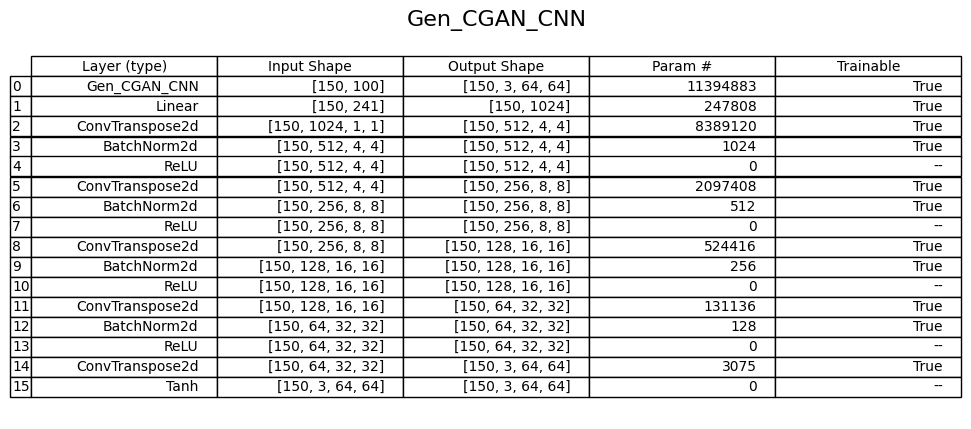

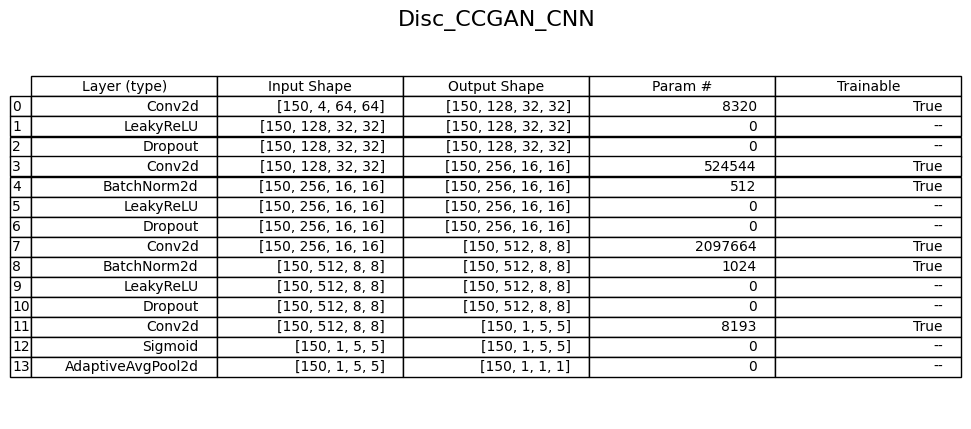

In [531]:
z = torch.randn(batch_size, latent_dim).to(device) 
labels = torch.randint(0, num_classes, (batch_size,)).to(device) 

class GeneratorWrapper(nn.Module):
    def __init__(self, generator):
        super(GeneratorWrapper, self).__init__()
        self.generator = generator
    
    def forward(self, *args):
        z, labels = args  # Unpack arguments
        return self.generator(z, labels)
    
wrapped_generator = GeneratorWrapper(generator_model)   
 
save_torch_summary(model=wrapped_generator,     model_name="Gen_CGAN_CNN",   input_size=None, input_data=(z, labels))
save_torch_summary(model=discriminator_model, model_name="Disc_CCGAN_CNN", input_size=(batch_size,  4, 64, 64) )

gen x: Tensor Shape: torch.Size([75, 241]), Min-Max: 0.00-1.00
Summary saved as Gen_CGAN_FC.png
disc x: Tensor Shape: torch.Size([75, 4237]), Min-Max: 0.00-1.00
Summary saved as Disc_CGAN_FC.png


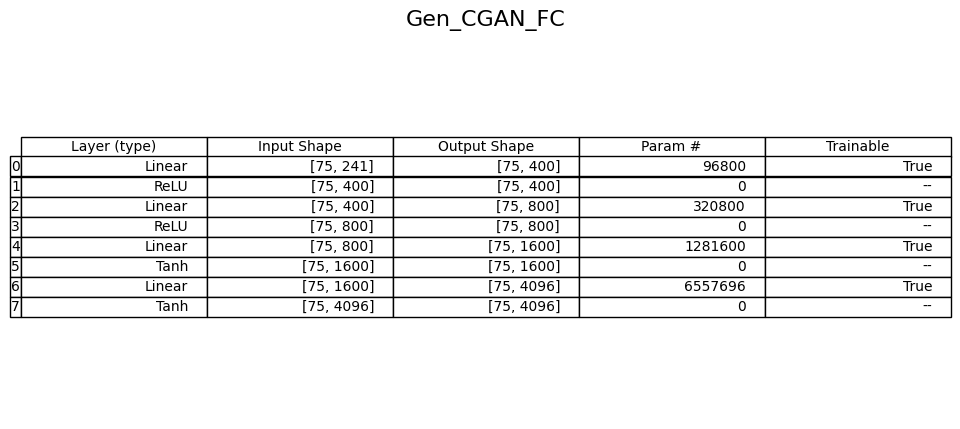

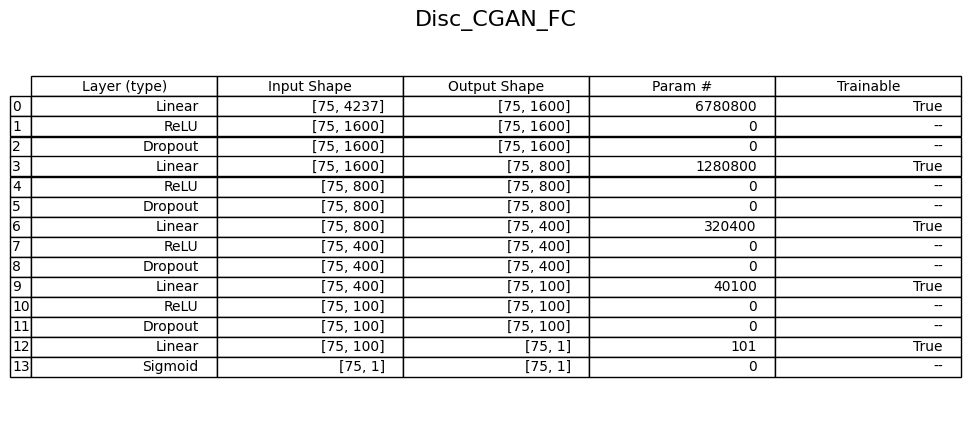

In [187]:
save_torch_summary(model=generator_model,     model_name="Gen_CGAN_FC",     input_size=(batch_size, num_classes + latent_dim))
save_torch_summary(model=discriminator_model, model_name="Disc_CGAN_FC", input_size=(batch_size, num_classes + (img_size * img_size)))

#### Run Network

Expected: Real, Predicted: Real
correct_real: 118, correct_fake: 139
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (57): Grapefruit Pink 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.686-1.000


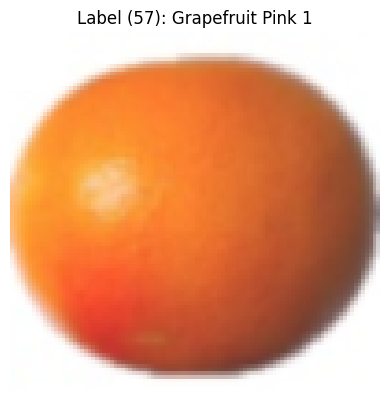

Data Collect: 0.28s                     Disc Time: 1.97s                     Gen Time: 0.95s
Expected: Fake, Predicted: Fake
Label (88): Peach 2       Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.998-0.999


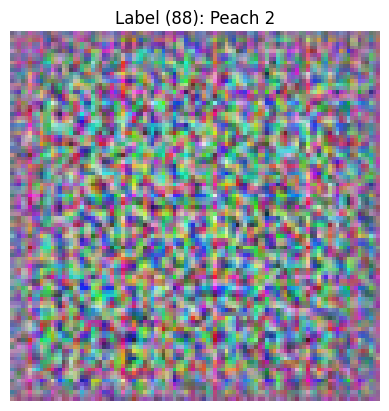

Epoch [1/100],                 DiscLoss: 0.0727,                 GenLoss: 0.2557,                 RealAcc: 0.48,                 FakeAcc: 0.07,                 Epoch Time: 44.40
Expected: Real, Predicted: Real
correct_real: 60, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (30): Cherry 1      Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -1.000-1.000


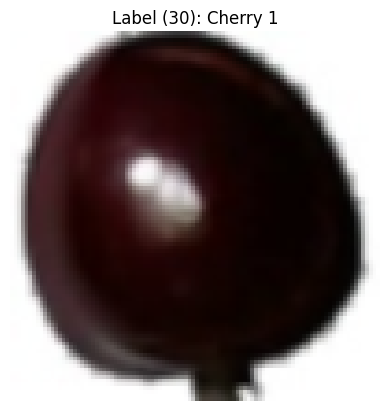

Data Collect: 0.21s                     Disc Time: 1.39s                     Gen Time: 1.00s
Expected: Fake, Predicted: Real
Label (41): Cucumber 1    Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-0.999


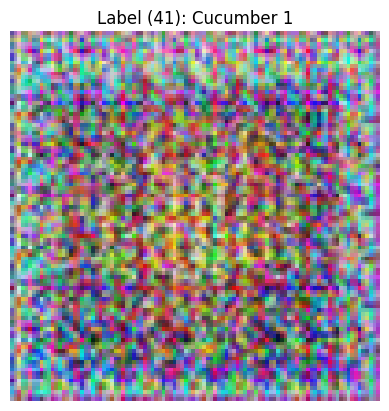

Epoch [2/100],                 DiscLoss: 0.0031,                 GenLoss: 0.0327,                 RealAcc: 0.40,                 FakeAcc: 0.00,                 Epoch Time: 54.18
Expected: Real, Predicted: Real
correct_real: 58, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (93): Pear Abate 1  Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.898-1.000


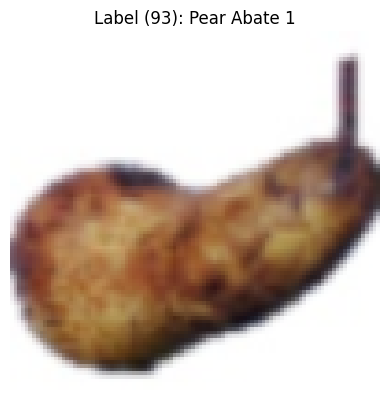

Data Collect: 0.25s                     Disc Time: 1.75s                     Gen Time: 1.22s
Expected: Fake, Predicted: Real
Label (92): Pear 3        Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.997-0.999


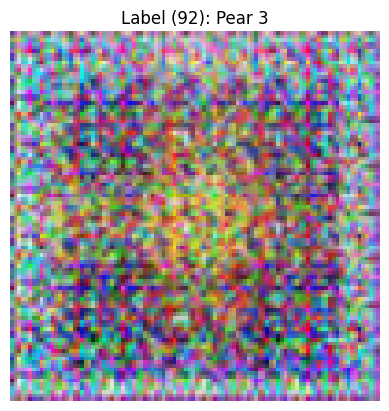

Epoch [3/100],                 DiscLoss: 0.0015,                 GenLoss: 0.0211,                 RealAcc: 0.39,                 FakeAcc: 0.00,                 Epoch Time: 73.14
Expected: Fake, Predicted: Fake
correct_real: 56, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (68): Limes 1       Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-0.998


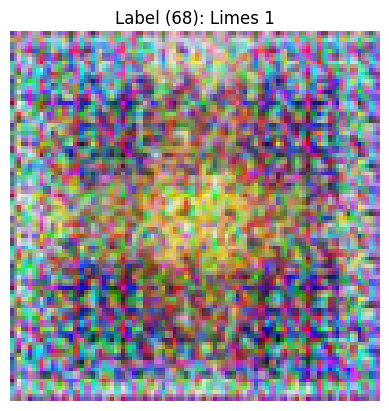

Data Collect: 0.36s                     Disc Time: 3.56s                     Gen Time: 1.78s
Expected: Fake, Predicted: Real
Label (52): Grape Pink 1  Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -1.000-0.998


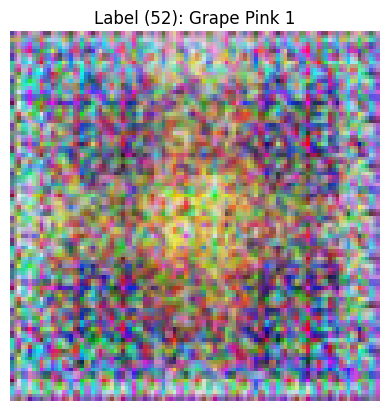

Epoch [4/100],                 DiscLoss: 0.0009,                 GenLoss: 0.0162,                 RealAcc: 0.39,                 FakeAcc: 0.00,                 Epoch Time: 81.07
Expected: Fake, Predicted: Fake
correct_real: 56, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (98): Pear Stone 1  Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-0.997


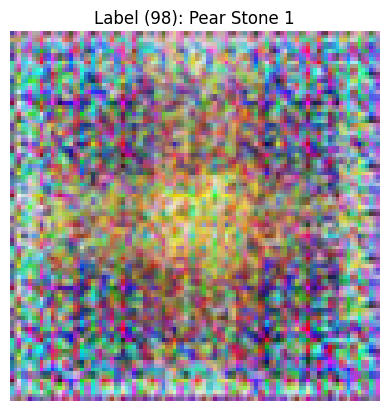

Data Collect: 0.41s                     Disc Time: 2.47s                     Gen Time: 1.73s
Expected: Fake, Predicted: Real
Label (77): Nectarine 1   Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-0.999


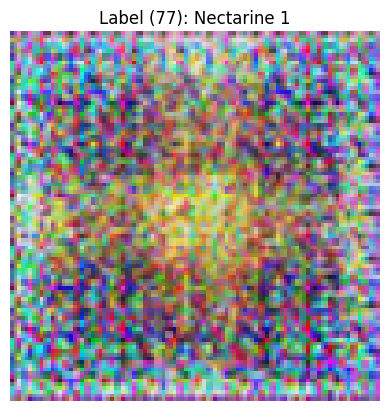

Epoch [5/100],                 DiscLoss: 0.0006,                 GenLoss: 0.0131,                 RealAcc: 0.38,                 FakeAcc: 0.00,                 Epoch Time: 71.99
Expected: Fake, Predicted: Fake
correct_real: 56, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (63): Kiwi 1        Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-0.999


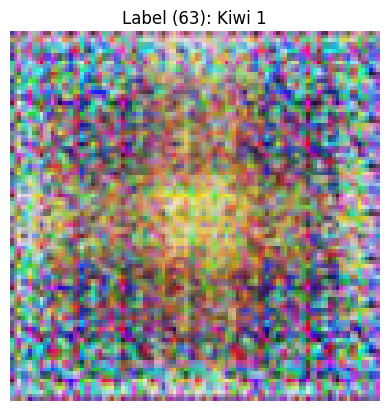

Data Collect: 0.34s                     Disc Time: 2.14s                     Gen Time: 1.47s
Expected: Fake, Predicted: Real
Label (98): Pear Stone 1  Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-0.997


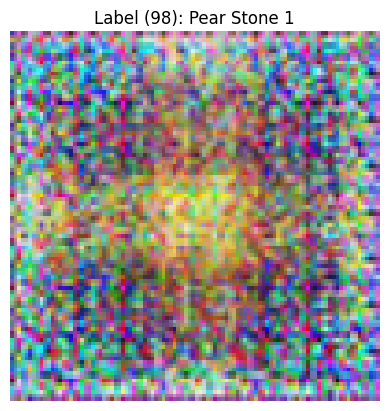

Epoch [6/100],                 DiscLoss: 0.0004,                 GenLoss: 0.0111,                 RealAcc: 0.38,                 FakeAcc: 0.00,                 Epoch Time: 74.13
Expected: Real, Predicted: Real
correct_real: 58, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (111): Plum 2       Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -1.000-1.000


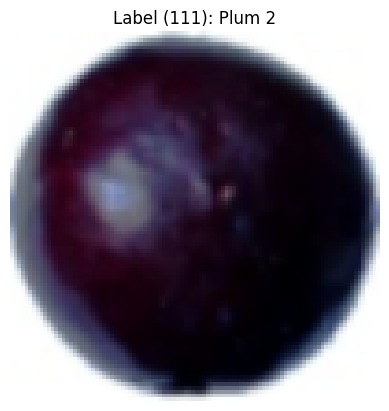

Data Collect: 0.35s                     Disc Time: 2.14s                     Gen Time: 1.59s
Expected: Fake, Predicted: Real
Label (74): Maracuja 1    Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.998-0.998


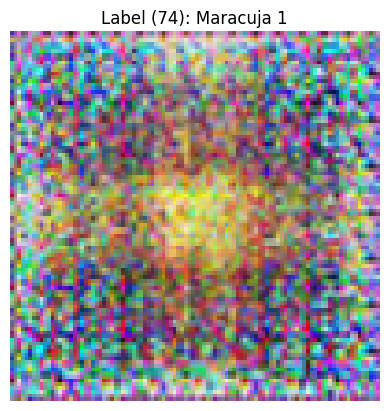

Epoch [7/100],                 DiscLoss: 0.0003,                 GenLoss: 0.0096,                 RealAcc: 0.39,                 FakeAcc: 0.00,                 Epoch Time: 87.77
Expected: Real, Predicted: Real
correct_real: 54, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (15): Apricot 1     Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.969-1.000


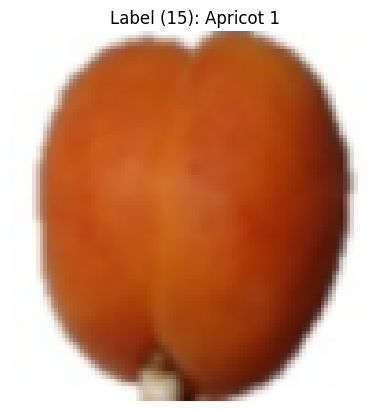

Data Collect: 0.37s                     Disc Time: 2.27s                     Gen Time: 1.75s
Expected: Fake, Predicted: Real
Label (101): Pepper Green 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-0.999


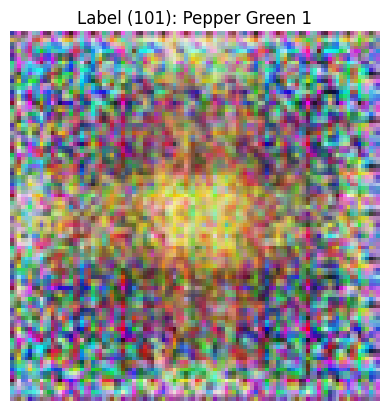

Epoch [8/100],                 DiscLoss: 0.0003,                 GenLoss: 0.0084,                 RealAcc: 0.38,                 FakeAcc: 0.00,                 Epoch Time: 85.39
Expected: Fake, Predicted: Fake
correct_real: 55, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (11): Apple Red Delicious 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -1.000-0.999


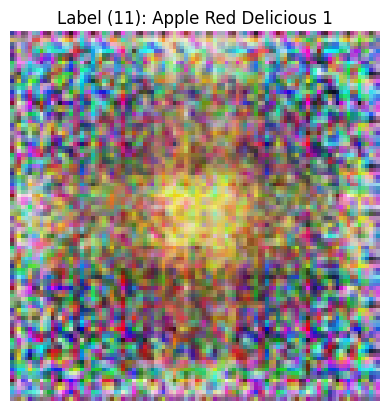

Data Collect: 0.36s                     Disc Time: 2.26s                     Gen Time: 1.70s
Expected: Fake, Predicted: Real
Label (19): Banana Lady Finger 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-0.999


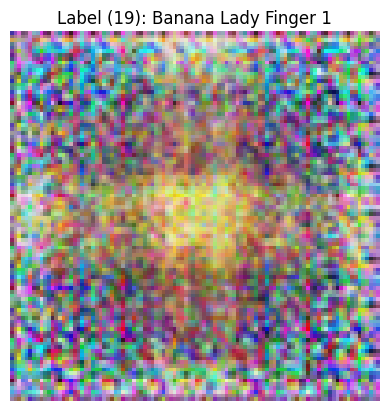

Epoch [9/100],                 DiscLoss: 0.0002,                 GenLoss: 0.0074,                 RealAcc: 0.38,                 FakeAcc: 0.00,                 Epoch Time: 90.92
Expected: Real, Predicted: Real
correct_real: 56, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (84): Orange 1      Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -1.000-1.000


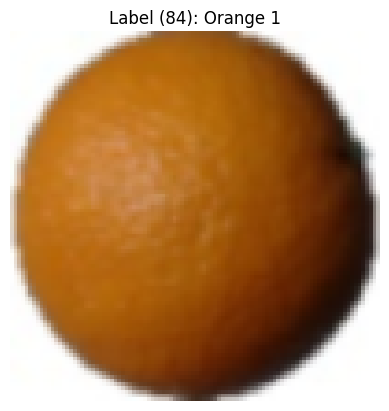

Data Collect: 0.48s                     Disc Time: 2.59s                     Gen Time: 1.88s
Expected: Fake, Predicted: Real
Label (130): Tomato 3     Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-0.999


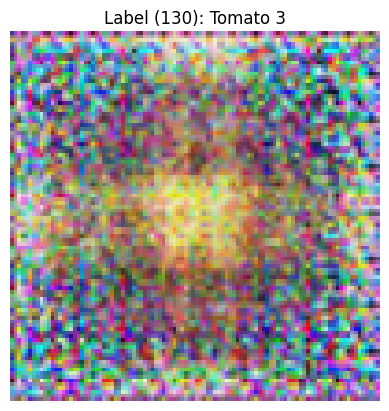

Epoch [10/100],                 DiscLoss: 0.0002,                 GenLoss: 0.0067,                 RealAcc: 0.37,                 FakeAcc: 0.00,                 Epoch Time: 93.36
Expected: Fake, Predicted: Fake
correct_real: 54, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (5): Apple Golden 3 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-0.999


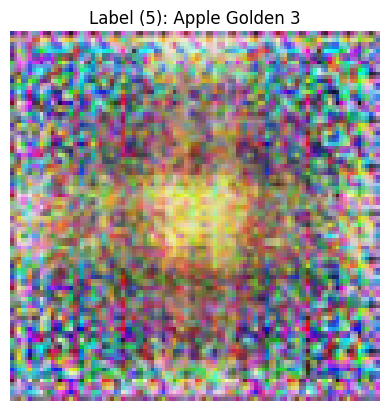

Data Collect: 0.44s                     Disc Time: 2.39s                     Gen Time: 1.91s
Expected: Fake, Predicted: Real
Label (101): Pepper Green 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -1.000-0.999


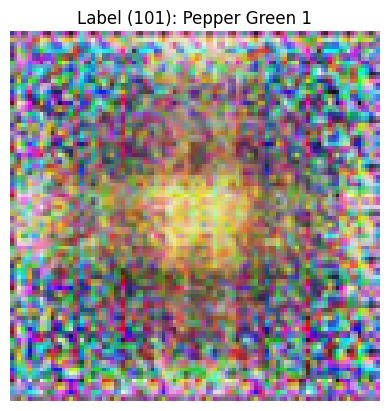

Epoch [11/100],                 DiscLoss: 0.0002,                 GenLoss: 0.0061,                 RealAcc: 0.38,                 FakeAcc: 0.00,                 Epoch Time: 90.15
Expected: Real, Predicted: Real
correct_real: 56, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (1): Apple Braeburn 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.992-1.000


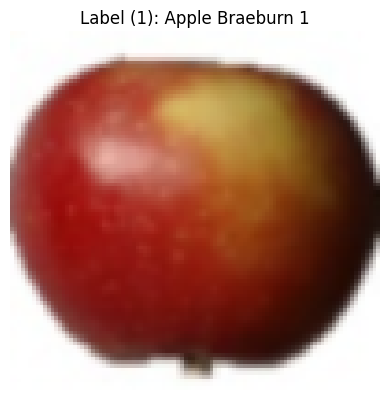

Data Collect: 0.45s                     Disc Time: 2.77s                     Gen Time: 2.41s
Expected: Fake, Predicted: Real
Label (118): Potato White 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-0.999


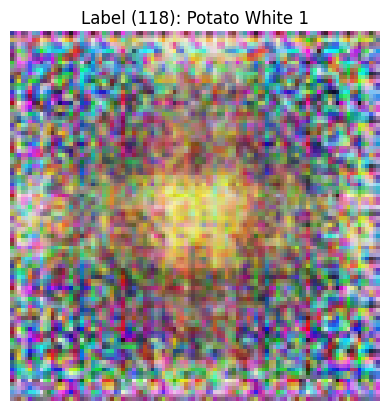

Epoch [12/100],                 DiscLoss: 0.0001,                 GenLoss: 0.0056,                 RealAcc: 0.37,                 FakeAcc: 0.00,                 Epoch Time: 105.72
Expected: Fake, Predicted: Fake
correct_real: 54, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (61): Huckleberry 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-0.999


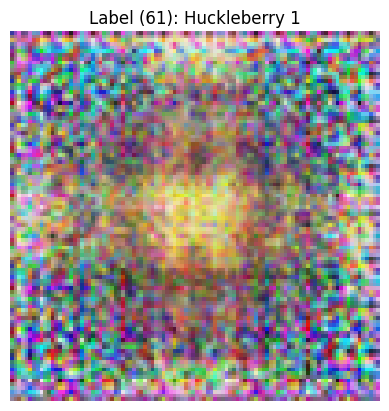

Data Collect: 0.42s                     Disc Time: 2.68s                     Gen Time: 2.14s
Expected: Fake, Predicted: Real
Label (18): Banana 1      Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-0.999


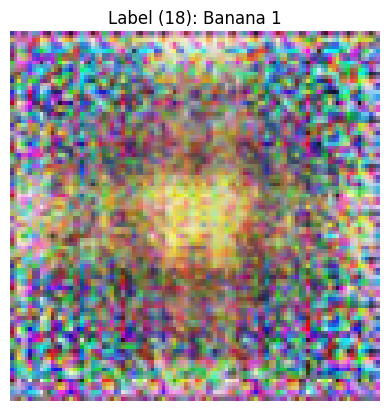

Epoch [13/100],                 DiscLoss: 0.0001,                 GenLoss: 0.0052,                 RealAcc: 0.37,                 FakeAcc: 0.00,                 Epoch Time: 106.75
Expected: Real, Predicted: Real
correct_real: 52, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (93): Pear Abate 1  Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -1.000-1.000


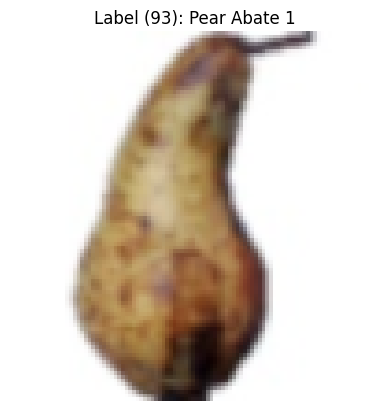

Data Collect: 0.51s                     Disc Time: 2.32s                     Gen Time: 1.64s
Expected: Fake, Predicted: Real
Label (32): Cherry Rainier 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-0.999


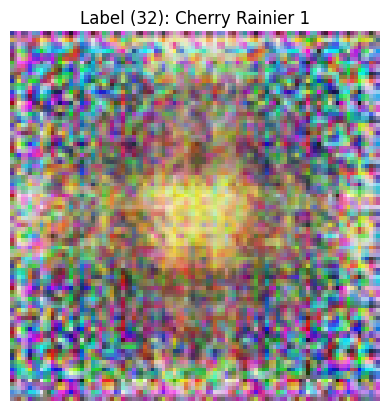

Epoch [14/100],                 DiscLoss: 0.0001,                 GenLoss: 0.0049,                 RealAcc: 0.37,                 FakeAcc: 0.00,                 Epoch Time: 94.24
Expected: Fake, Predicted: Fake
correct_real: 51, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (135): Tomato Yellow 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


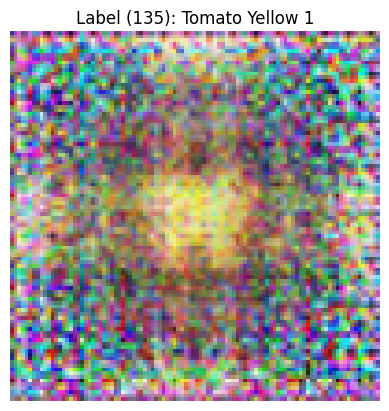

Data Collect: 0.46s                     Disc Time: 2.59s                     Gen Time: 2.29s
Expected: Fake, Predicted: Real
Label (11): Apple Red Delicious 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-0.999


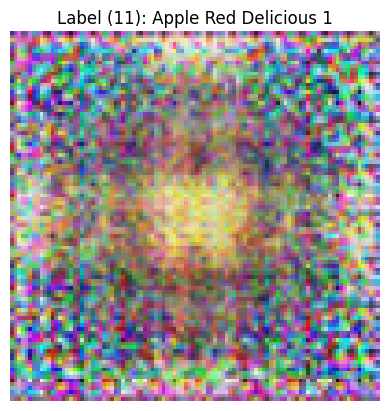

Epoch [15/100],                 DiscLoss: 0.0001,                 GenLoss: 0.0046,                 RealAcc: 0.36,                 FakeAcc: 0.00,                 Epoch Time: 84.01
Expected: Real, Predicted: Real
correct_real: 53, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (23): Cabbage white 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.796-1.000


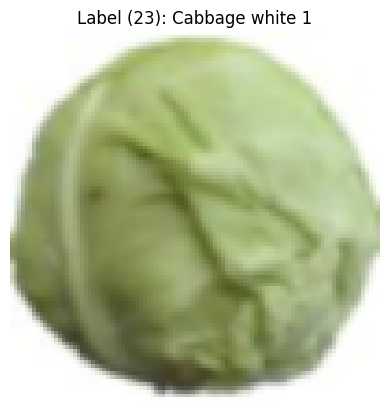

Data Collect: 0.50s                     Disc Time: 2.98s                     Gen Time: 2.72s
Expected: Fake, Predicted: Real
Label (15): Apricot 1     Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -1.000-0.999


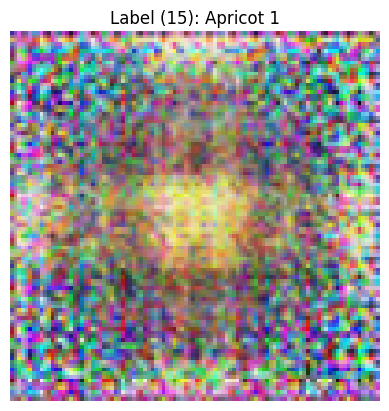

Epoch [16/100],                 DiscLoss: 0.0001,                 GenLoss: 0.0043,                 RealAcc: 0.36,                 FakeAcc: 0.00,                 Epoch Time: 79.50
Expected: Fake, Predicted: Fake
correct_real: 51, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (124): Strawberry 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-0.999


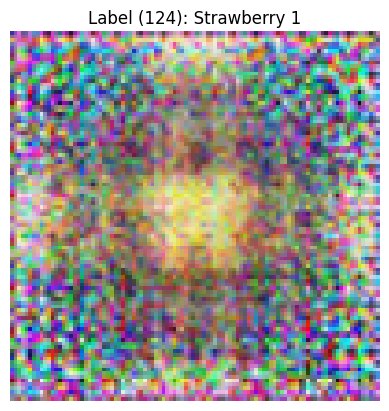

Data Collect: 0.29s                     Disc Time: 2.15s                     Gen Time: 2.12s
Expected: Fake, Predicted: Real
Label (65): Kumquats 1    Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -1.000-0.999


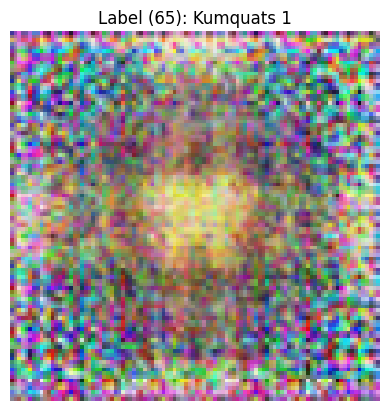

Epoch [17/100],                 DiscLoss: 0.0001,                 GenLoss: 0.0041,                 RealAcc: 0.36,                 FakeAcc: 0.00,                 Epoch Time: 81.41
Expected: Real, Predicted: Real
correct_real: 51, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (46): Eggplant 1    Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.937-1.000


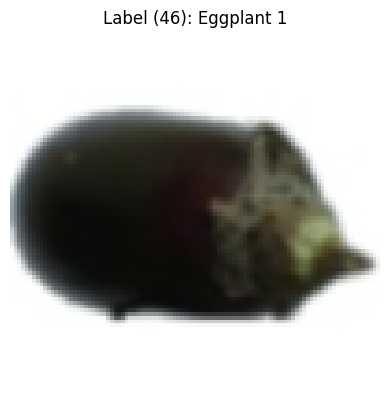

Data Collect: 0.50s                     Disc Time: 3.25s                     Gen Time: 2.32s
Expected: Fake, Predicted: Real
Label (121): Raspberry 1  Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-0.999


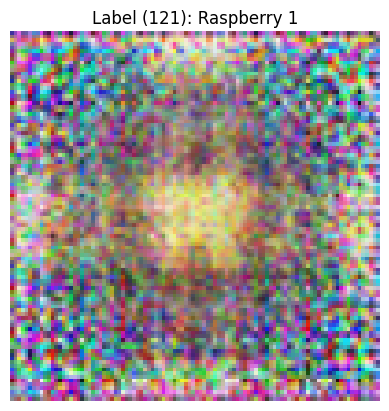

Epoch [18/100],                 DiscLoss: 0.0001,                 GenLoss: 0.0039,                 RealAcc: 0.36,                 FakeAcc: 0.00,                 Epoch Time: 102.58
Expected: Real, Predicted: Real
correct_real: 53, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (59): Guava 1       Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.984-1.000


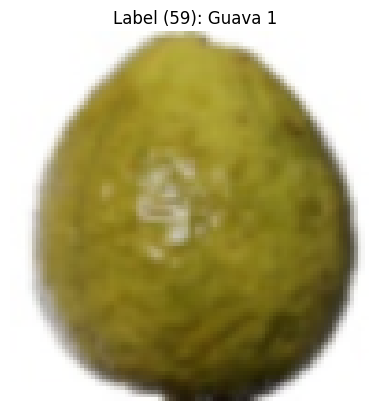

Data Collect: 0.42s                     Disc Time: 2.33s                     Gen Time: 1.94s
Expected: Fake, Predicted: Real
Label (91): Pear 2        Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -1.000-1.000


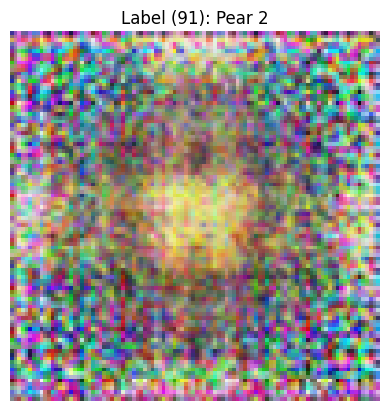

Epoch [19/100],                 DiscLoss: 0.0001,                 GenLoss: 0.0037,                 RealAcc: 0.36,                 FakeAcc: 0.00,                 Epoch Time: 99.05
Expected: Fake, Predicted: Fake
correct_real: 53, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (38): Cocos 1       Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


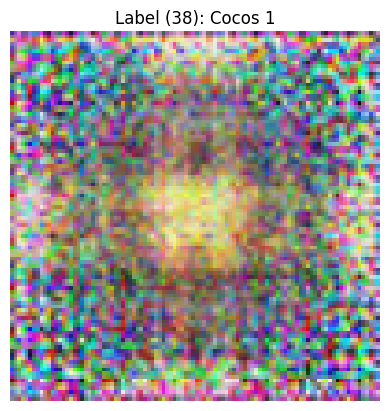

Data Collect: 0.40s                     Disc Time: 2.54s                     Gen Time: 2.00s
Expected: Fake, Predicted: Real
Label (128): Tomato 1     Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


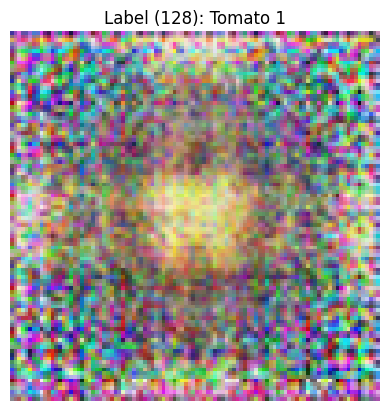

Epoch [20/100],                 DiscLoss: 0.0001,                 GenLoss: 0.0035,                 RealAcc: 0.36,                 FakeAcc: 0.00,                 Epoch Time: 103.46
Expected: Real, Predicted: Real
correct_real: 47, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (16): Avocado 1     Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -1.000-1.000


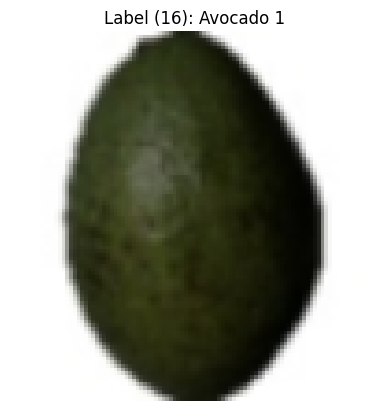

Data Collect: 0.54s                     Disc Time: 3.51s                     Gen Time: 2.54s
Expected: Fake, Predicted: Real
Label (71): Mango 1       Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-0.999


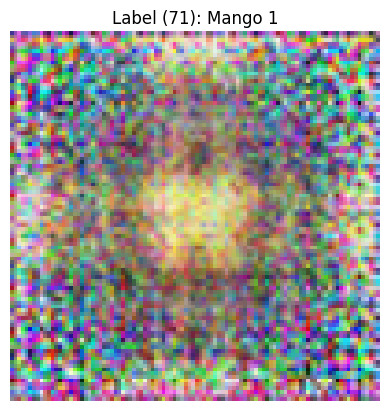

Epoch [21/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0034,                 RealAcc: 0.36,                 FakeAcc: 0.00,                 Epoch Time: 109.96
Expected: Real, Predicted: Real
correct_real: 55, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (5): Apple Golden 3 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -1.000-1.000


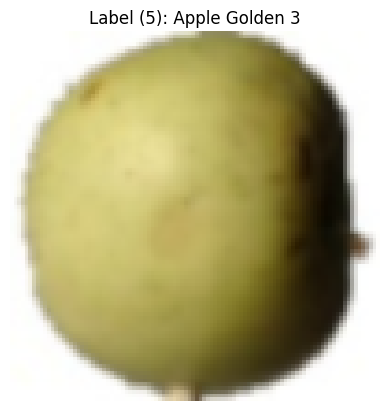

Data Collect: 0.47s                     Disc Time: 3.35s                     Gen Time: 2.09s
Expected: Fake, Predicted: Real
Label (28): Carrot 1      Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


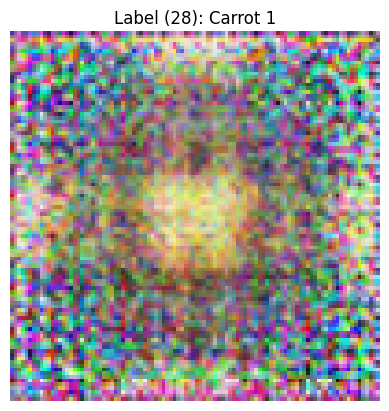

Epoch [22/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0033,                 RealAcc: 0.36,                 FakeAcc: 0.00,                 Epoch Time: 80.57
Expected: Fake, Predicted: Fake
correct_real: 52, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (62): Kaki 1        Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


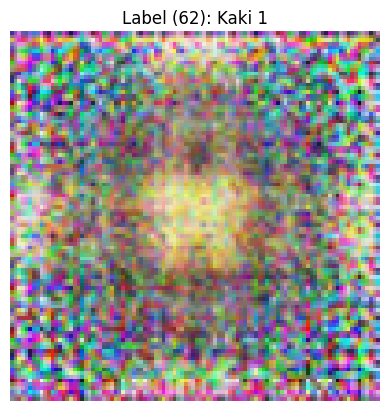

Data Collect: 0.34s                     Disc Time: 2.17s                     Gen Time: 2.05s
Expected: Fake, Predicted: Real
Label (63): Kiwi 1        Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -1.000-1.000


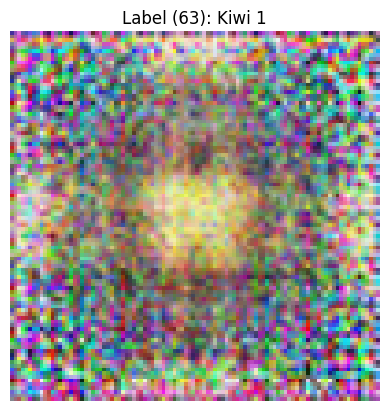

Epoch [23/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0031,                 RealAcc: 0.36,                 FakeAcc: 0.00,                 Epoch Time: 83.47
Expected: Fake, Predicted: Fake
correct_real: 54, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (5): Apple Golden 3 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


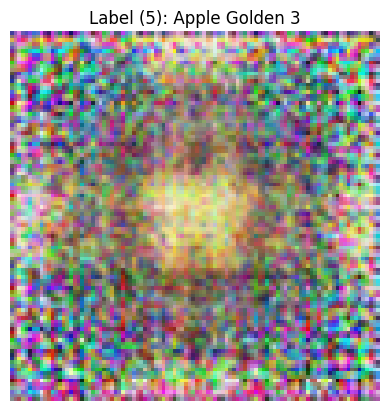

Data Collect: 0.33s                     Disc Time: 2.39s                     Gen Time: 1.62s
Expected: Fake, Predicted: Real
Label (59): Guava 1       Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -1.000-1.000


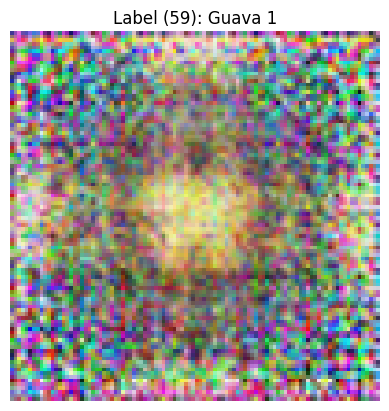

Epoch [24/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0030,                 RealAcc: 0.36,                 FakeAcc: 0.00,                 Epoch Time: 103.16
Expected: Fake, Predicted: Fake
correct_real: 52, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (56): Grape White 4 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


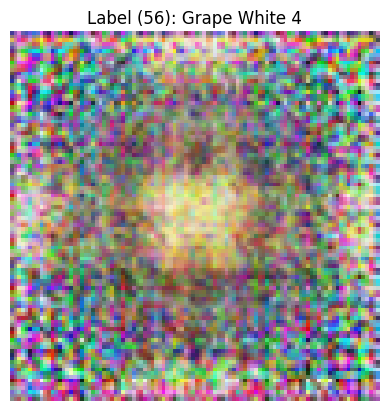

Data Collect: 0.47s                     Disc Time: 2.98s                     Gen Time: 2.22s
Expected: Fake, Predicted: Real
Label (52): Grape Pink 1  Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


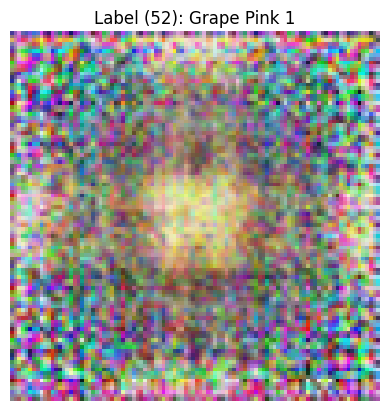

Epoch [25/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0030,                 RealAcc: 0.36,                 FakeAcc: 0.00,                 Epoch Time: 113.37
Expected: Fake, Predicted: Fake
correct_real: 53, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (8): Apple Red 1    Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -1.000-1.000


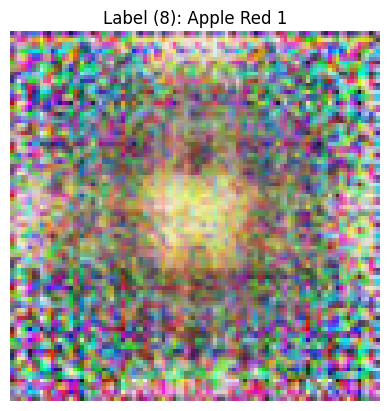

Data Collect: 0.52s                     Disc Time: 2.99s                     Gen Time: 2.20s
Expected: Fake, Predicted: Real
Label (131): Tomato 4     Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


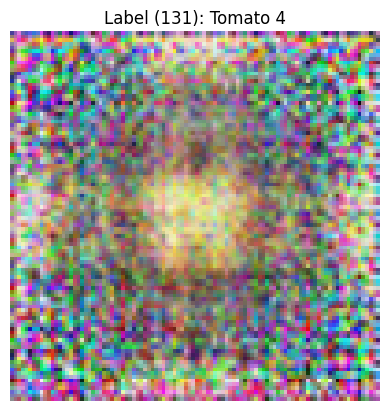

Epoch [26/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0028,                 RealAcc: 0.36,                 FakeAcc: 0.00,                 Epoch Time: 86.10
Expected: Fake, Predicted: Fake
correct_real: 53, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (78): Nectarine Flat 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


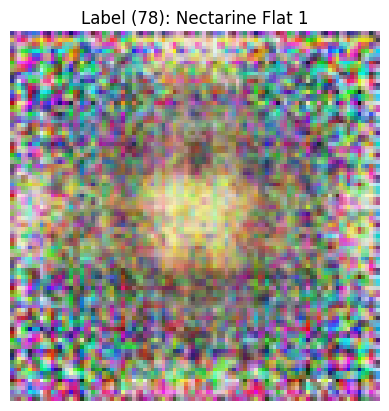

Data Collect: 0.35s                     Disc Time: 2.19s                     Gen Time: 1.95s
Expected: Fake, Predicted: Real
Label (38): Cocos 1       Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


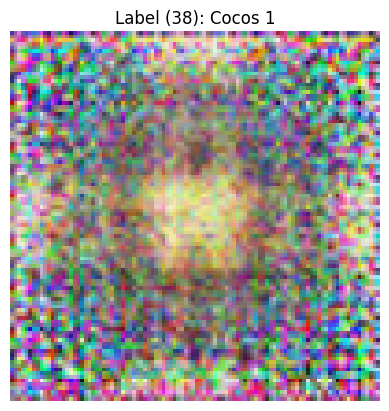

Epoch [27/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0027,                 RealAcc: 0.36,                 FakeAcc: 0.00,                 Epoch Time: 81.96
Expected: Fake, Predicted: Fake
correct_real: 55, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (31): Cherry 2      Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


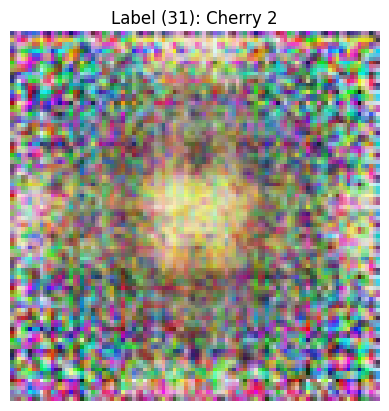

Data Collect: 0.33s                     Disc Time: 2.21s                     Gen Time: 1.75s
Expected: Fake, Predicted: Real
Label (24): Cactus fruit 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -1.000-1.000


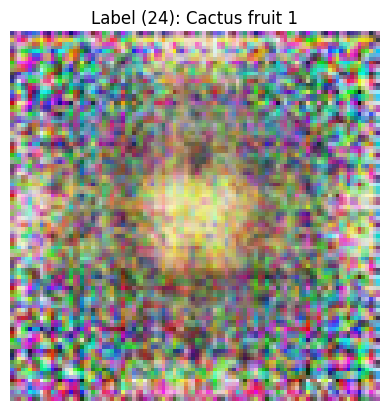

Epoch [28/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0027,                 RealAcc: 0.37,                 FakeAcc: 0.00,                 Epoch Time: 89.24
Expected: Real, Predicted: Real
correct_real: 54, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (35): Cherry Wax Yellow 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.890-1.000


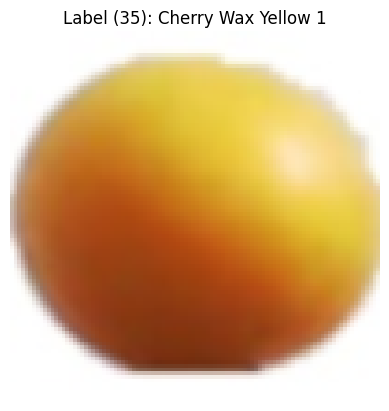

Data Collect: 0.40s                     Disc Time: 2.55s                     Gen Time: 1.84s
Expected: Fake, Predicted: Real
Label (98): Pear Stone 1  Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -1.000-1.000


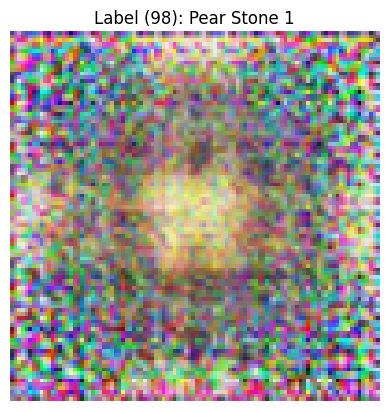

Epoch [29/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0026,                 RealAcc: 0.37,                 FakeAcc: 0.00,                 Epoch Time: 83.26
Expected: Real, Predicted: Real
correct_real: 55, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (12): Apple Red Yellow 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.976-1.000


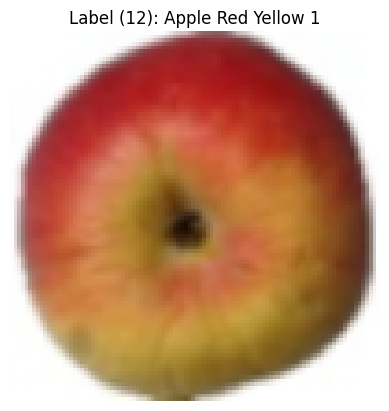

Data Collect: 0.44s                     Disc Time: 2.43s                     Gen Time: 2.13s
Expected: Fake, Predicted: Real
Label (90): Pear 1        Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


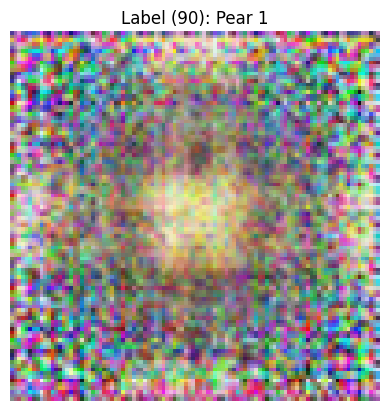

Epoch [30/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0025,                 RealAcc: 0.36,                 FakeAcc: 0.00,                 Epoch Time: 78.69
Expected: Fake, Predicted: Fake
correct_real: 51, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (20): Banana Red 1  Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


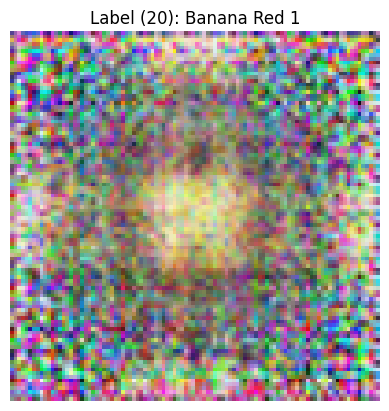

Data Collect: 0.42s                     Disc Time: 2.56s                     Gen Time: 1.53s
Expected: Fake, Predicted: Real
Label (140): Zucchini dark 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


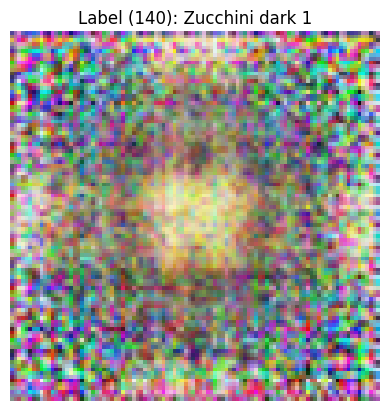

Epoch [31/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0024,                 RealAcc: 0.36,                 FakeAcc: 0.00,                 Epoch Time: 87.62
Expected: Fake, Predicted: Fake
correct_real: 54, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (16): Avocado 1     Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -1.000-1.000


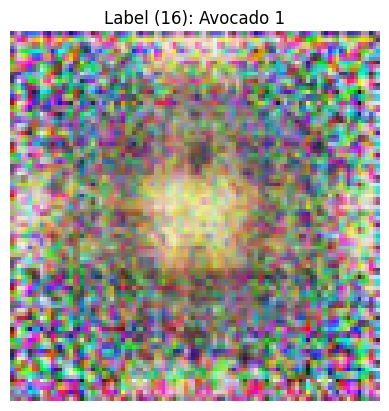

Data Collect: 0.35s                     Disc Time: 2.01s                     Gen Time: 1.40s
Expected: Fake, Predicted: Real
Label (91): Pear 2        Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


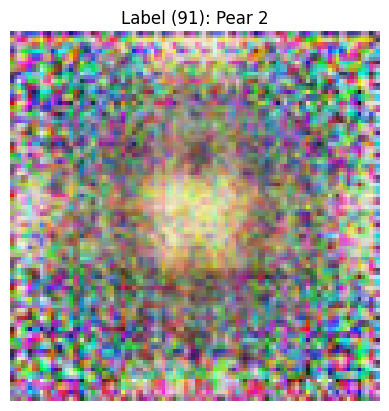

Epoch [32/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0024,                 RealAcc: 0.37,                 FakeAcc: 0.00,                 Epoch Time: 83.15
Expected: Real, Predicted: Real
correct_real: 50, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (9): Apple Red 2    Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -1.000-1.000


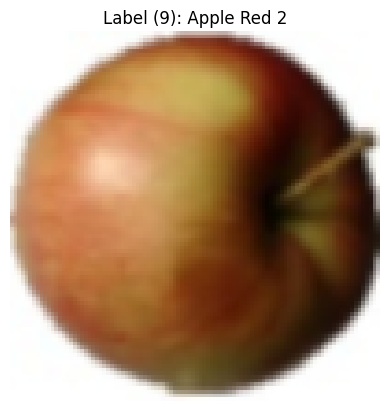

Data Collect: 0.34s                     Disc Time: 2.11s                     Gen Time: 1.53s
Expected: Fake, Predicted: Real
Label (120): Rambutan 1   Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -1.000-1.000


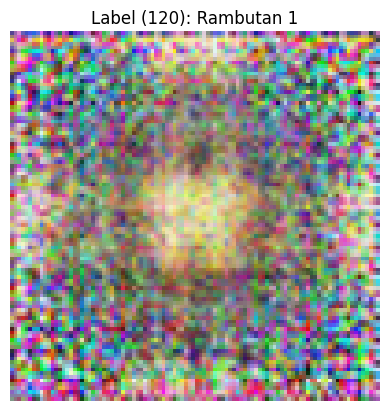

Epoch [33/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0023,                 RealAcc: 0.37,                 FakeAcc: 0.00,                 Epoch Time: 75.88
Expected: Fake, Predicted: Fake
correct_real: 55, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (91): Pear 2        Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -1.000-1.000


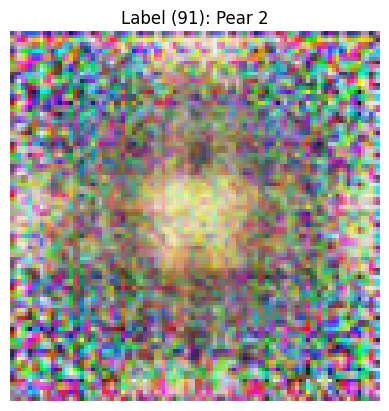

Data Collect: 0.60s                     Disc Time: 3.21s                     Gen Time: 2.14s
Expected: Fake, Predicted: Real
Label (31): Cherry 2      Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -1.000-1.000


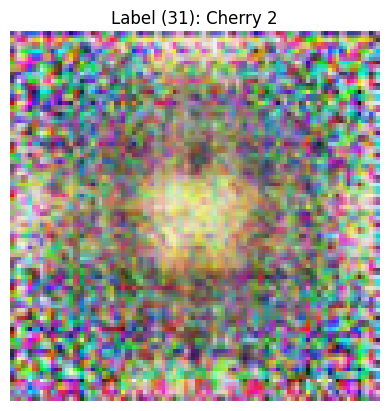

Epoch [34/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0022,                 RealAcc: 0.37,                 FakeAcc: 0.00,                 Epoch Time: 85.82
Expected: Fake, Predicted: Fake
correct_real: 52, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (106): Physalis with Husk 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


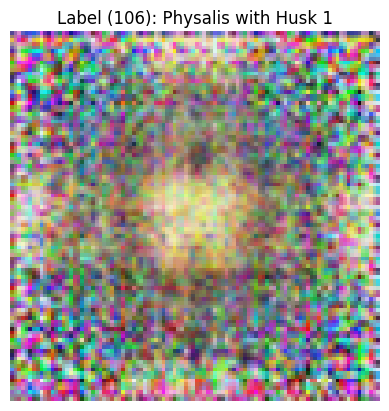

Data Collect: 0.53s                     Disc Time: 2.98s                     Gen Time: 2.51s
Expected: Fake, Predicted: Real
Label (22): Blueberry 1   Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -1.000-1.000


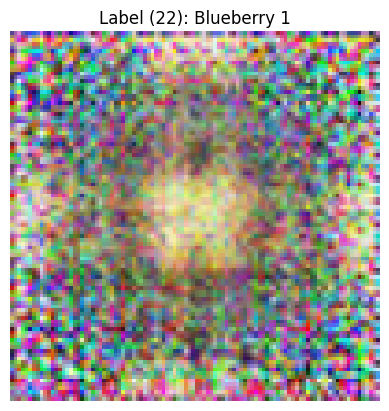

Epoch [35/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0022,                 RealAcc: 0.37,                 FakeAcc: 0.00,                 Epoch Time: 90.87
Expected: Fake, Predicted: Fake
correct_real: 51, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (81): Onion Red 1   Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


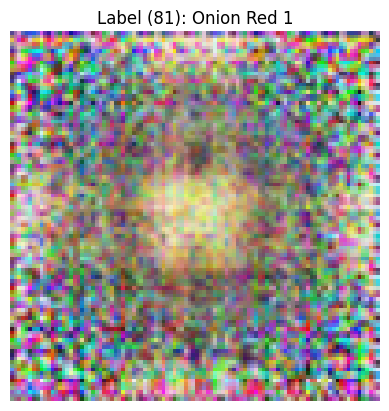

Data Collect: 0.35s                     Disc Time: 2.85s                     Gen Time: 2.42s
Expected: Fake, Predicted: Real
Label (38): Cocos 1       Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


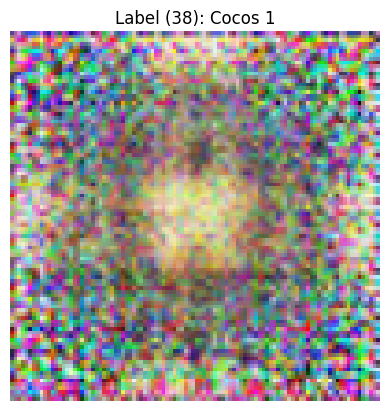

Epoch [36/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0021,                 RealAcc: 0.37,                 FakeAcc: 0.00,                 Epoch Time: 94.13
Expected: Real, Predicted: Real
correct_real: 54, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (117): Potato Sweet 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.741-1.000


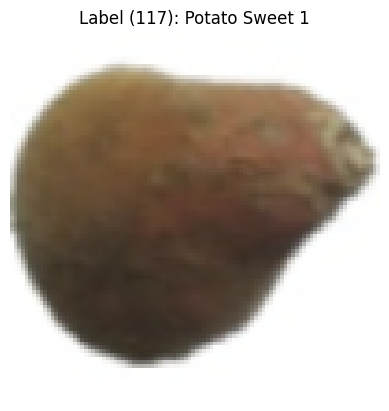

Data Collect: 0.40s                     Disc Time: 2.44s                     Gen Time: 2.26s
Expected: Fake, Predicted: Real
Label (44): Cucumber Ripe 2 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


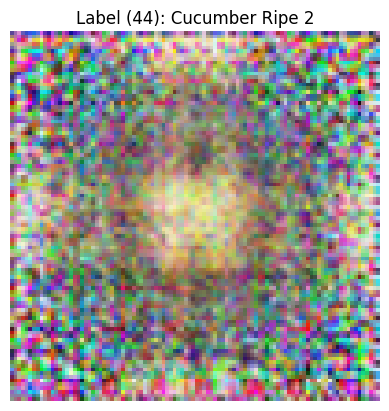

Epoch [37/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0021,                 RealAcc: 0.37,                 FakeAcc: 0.00,                 Epoch Time: 97.78
Expected: Real, Predicted: Real
correct_real: 54, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (93): Pear Abate 1  Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.898-1.000


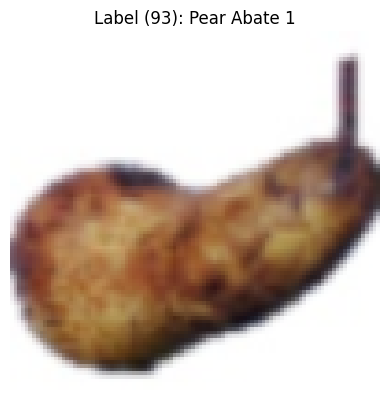

Data Collect: 0.53s                     Disc Time: 3.10s                     Gen Time: 2.29s
Expected: Fake, Predicted: Real
Label (71): Mango 1       Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


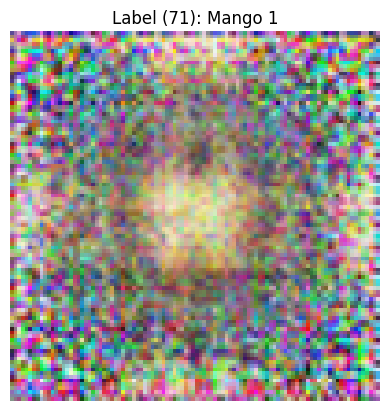

Epoch [38/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0020,                 RealAcc: 0.38,                 FakeAcc: 0.00,                 Epoch Time: 113.52
Expected: Real, Predicted: Real
correct_real: 52, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (95): Pear Kaiser 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.882-1.000


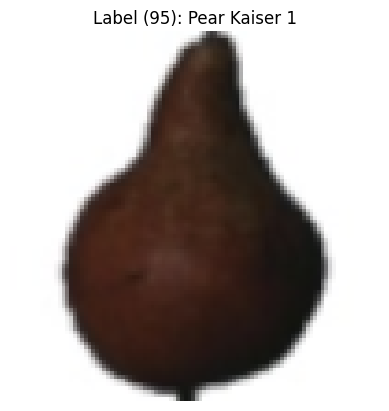

Data Collect: 0.46s                     Disc Time: 2.76s                     Gen Time: 2.64s
Expected: Fake, Predicted: Real
Label (69): Lychee 1      Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


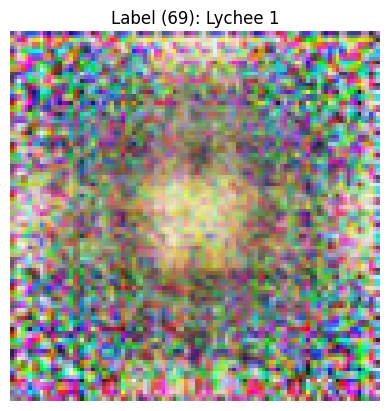

Epoch [39/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0020,                 RealAcc: 0.37,                 FakeAcc: 0.00,                 Epoch Time: 100.38
Expected: Real, Predicted: Real
correct_real: 54, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (130): Tomato 3     Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.961-1.000


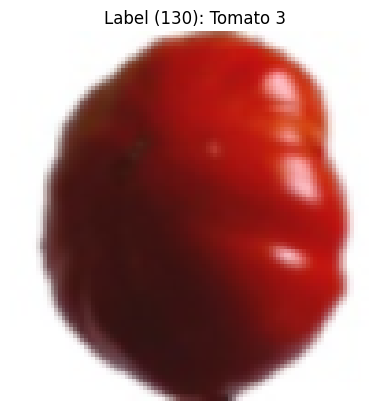

Data Collect: 0.34s                     Disc Time: 2.66s                     Gen Time: 1.81s
Expected: Fake, Predicted: Real
Label (5): Apple Golden 3 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


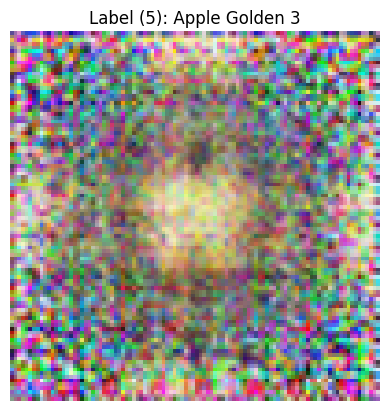

Epoch [40/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0020,                 RealAcc: 0.38,                 FakeAcc: 0.00,                 Epoch Time: 76.41
Expected: Real, Predicted: Real
correct_real: 55, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (94): Pear Forelle 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -1.000-1.000


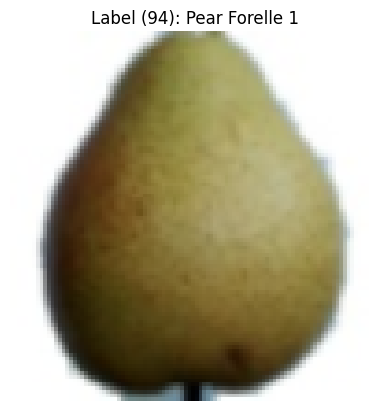

Data Collect: 0.53s                     Disc Time: 2.22s                     Gen Time: 2.44s
Expected: Fake, Predicted: Real
Label (19): Banana Lady Finger 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


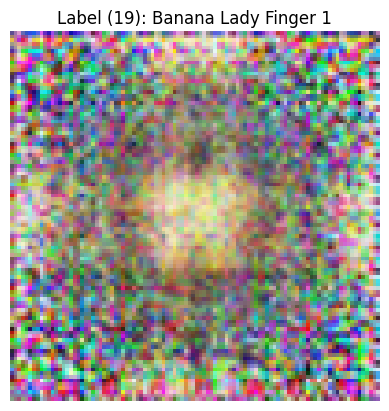

Epoch [41/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0019,                 RealAcc: 0.38,                 FakeAcc: 0.00,                 Epoch Time: 111.79
Expected: Fake, Predicted: Fake
correct_real: 52, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (14): Apple hit 1   Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


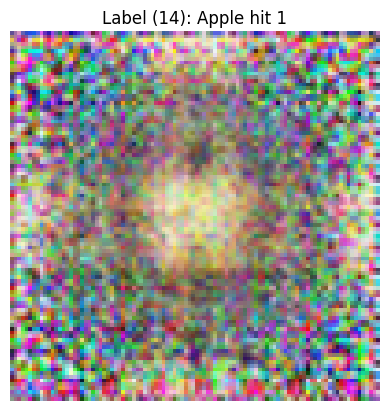

Data Collect: 0.50s                     Disc Time: 3.33s                     Gen Time: 2.20s
Expected: Fake, Predicted: Real
Label (63): Kiwi 1        Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


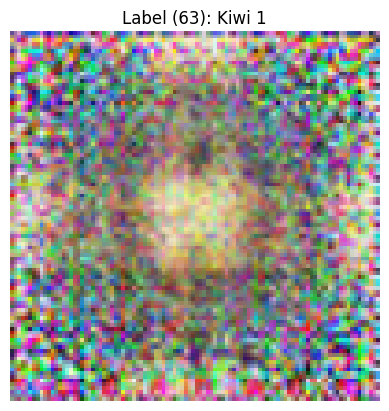

Epoch [42/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0019,                 RealAcc: 0.38,                 FakeAcc: 0.00,                 Epoch Time: 105.46
Expected: Real, Predicted: Real
correct_real: 55, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (8): Apple Red 1    Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.929-1.000


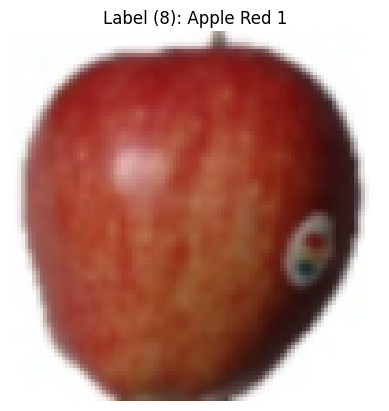

Data Collect: 0.31s                     Disc Time: 2.23s                     Gen Time: 1.96s
Expected: Fake, Predicted: Real
Label (26): Cantaloupe 2  Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


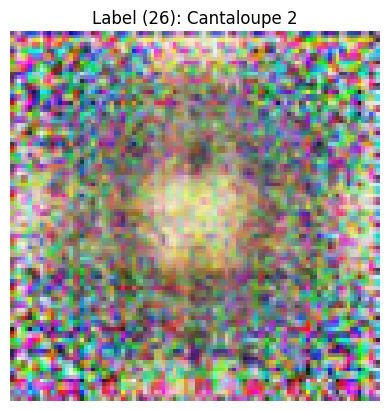

Epoch [43/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0019,                 RealAcc: 0.38,                 FakeAcc: 0.00,                 Epoch Time: 79.56
Expected: Real, Predicted: Real
correct_real: 53, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (58): Grapefruit White 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.976-1.000


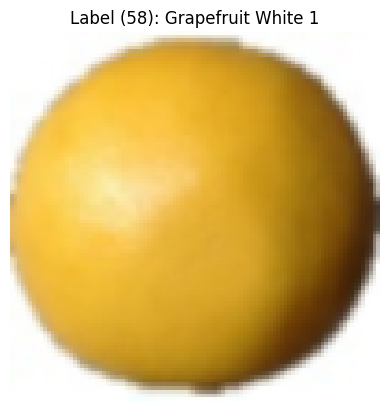

Data Collect: 0.34s                     Disc Time: 2.56s                     Gen Time: 2.07s
Expected: Fake, Predicted: Real
Label (75): Melon Piel de Sapo 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


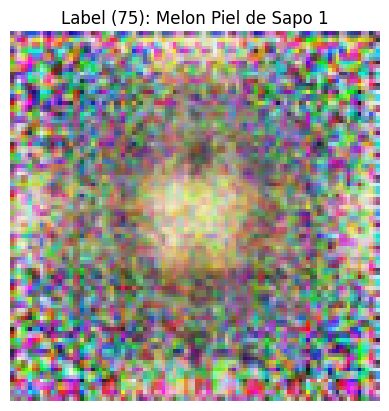

Epoch [44/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0019,                 RealAcc: 0.38,                 FakeAcc: 0.00,                 Epoch Time: 94.16
Expected: Real, Predicted: Real
correct_real: 56, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (114): Pomelo Sweetie 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.945-1.000


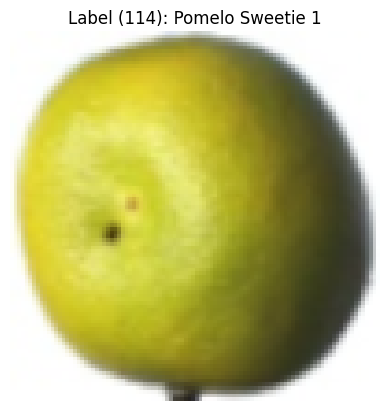

Data Collect: 0.53s                     Disc Time: 3.44s                     Gen Time: 2.36s
Expected: Fake, Predicted: Real
Label (104): Pepper Yellow 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


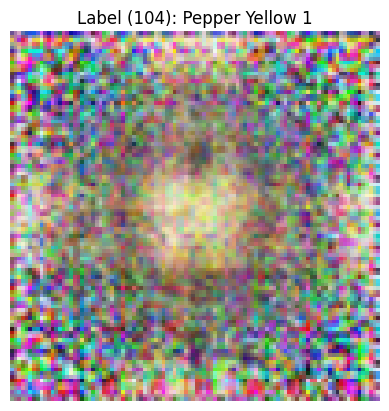

Epoch [45/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0018,                 RealAcc: 0.38,                 FakeAcc: 0.00,                 Epoch Time: 96.95
Expected: Fake, Predicted: Fake
correct_real: 54, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (76): Mulberry 1    Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.998-1.000


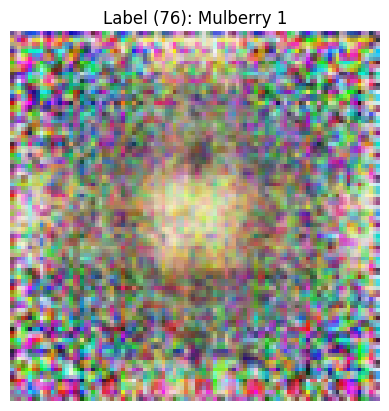

Data Collect: 0.45s                     Disc Time: 2.52s                     Gen Time: 1.92s
Expected: Fake, Predicted: Real
Label (23): Cabbage white 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


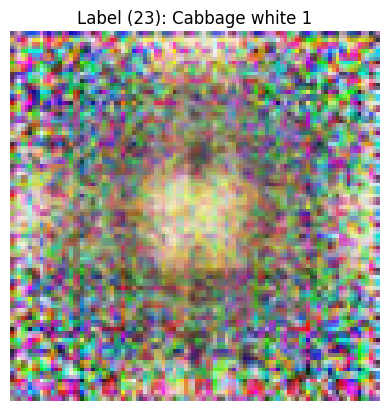

Epoch [46/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0018,                 RealAcc: 0.38,                 FakeAcc: 0.00,                 Epoch Time: 96.28
Expected: Real, Predicted: Real
correct_real: 54, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (37): Clementine 1  Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.780-1.000


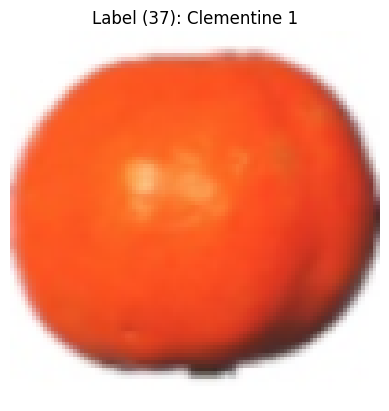

Data Collect: 0.44s                     Disc Time: 2.99s                     Gen Time: 2.08s
Expected: Fake, Predicted: Real
Label (35): Cherry Wax Yellow 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


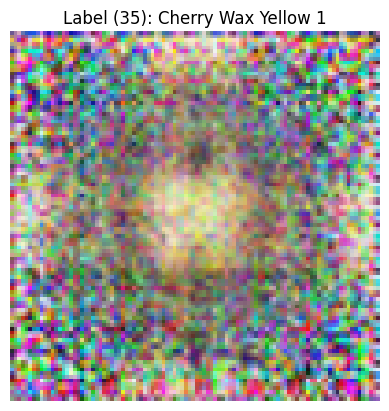

Epoch [47/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0017,                 RealAcc: 0.38,                 FakeAcc: 0.00,                 Epoch Time: 97.26
Expected: Fake, Predicted: Fake
correct_real: 52, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (124): Strawberry 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


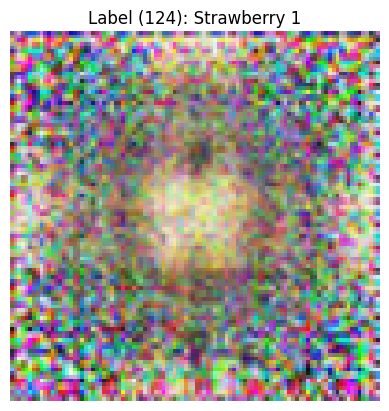

Data Collect: 0.27s                     Disc Time: 1.75s                     Gen Time: 1.25s
Expected: Fake, Predicted: Real
Label (59): Guava 1       Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


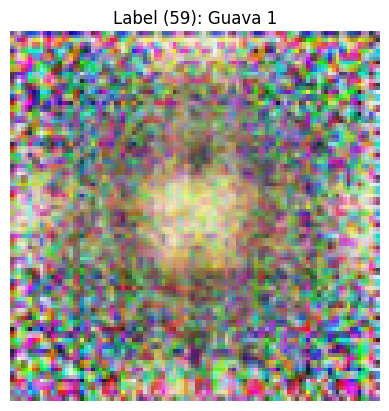

Epoch [48/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0017,                 RealAcc: 0.38,                 FakeAcc: 0.00,                 Epoch Time: 53.85
Expected: Fake, Predicted: Fake
correct_real: 52, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (81): Onion Red 1   Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.998-1.000


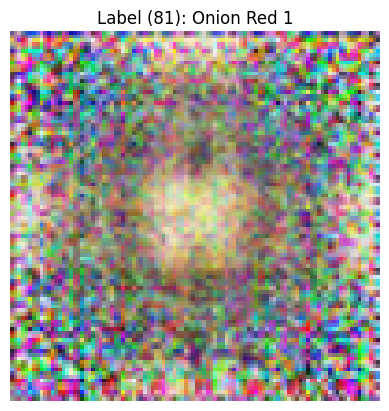

Data Collect: 0.24s                     Disc Time: 1.65s                     Gen Time: 1.07s
Expected: Fake, Predicted: Real
Label (125): Strawberry Wedge 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


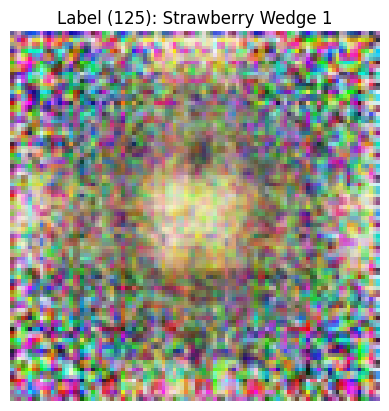

Epoch [49/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0017,                 RealAcc: 0.39,                 FakeAcc: 0.00,                 Epoch Time: 63.92
Expected: Real, Predicted: Real
correct_real: 54, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (23): Cabbage white 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.820-1.000


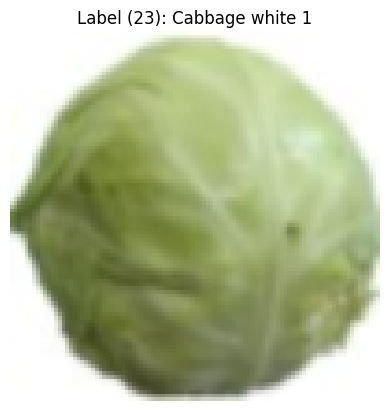

Data Collect: 0.23s                     Disc Time: 1.63s                     Gen Time: 1.02s
Expected: Fake, Predicted: Real
Label (31): Cherry 2      Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


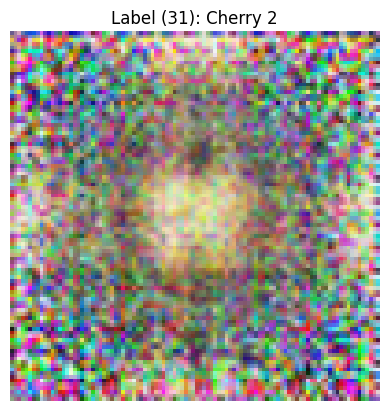

Epoch [50/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0017,                 RealAcc: 0.38,                 FakeAcc: 0.00,                 Epoch Time: 50.73
Expected: Fake, Predicted: Fake
correct_real: 50, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (63): Kiwi 1        Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.998-1.000


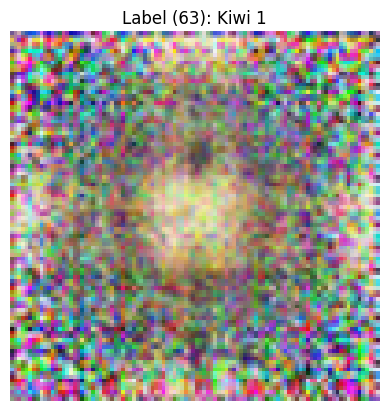

Data Collect: 0.24s                     Disc Time: 1.67s                     Gen Time: 3.42s
Expected: Fake, Predicted: Real
Label (140): Zucchini dark 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


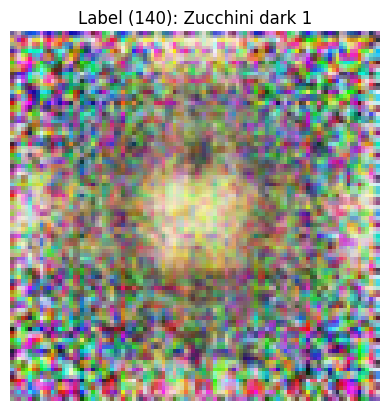

Epoch [51/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0017,                 RealAcc: 0.38,                 FakeAcc: 0.00,                 Epoch Time: 94.95
Expected: Real, Predicted: Real
correct_real: 54, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (134): Tomato Maroon 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.671-1.000


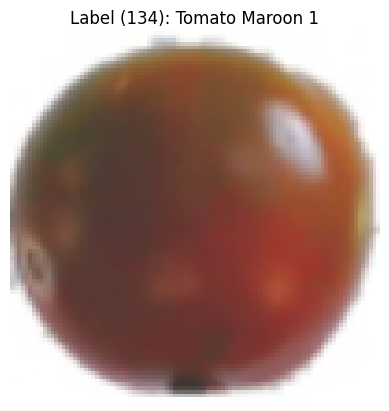

Data Collect: 0.46s                     Disc Time: 2.80s                     Gen Time: 1.94s
Expected: Fake, Predicted: Real
Label (99): Pear Williams 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


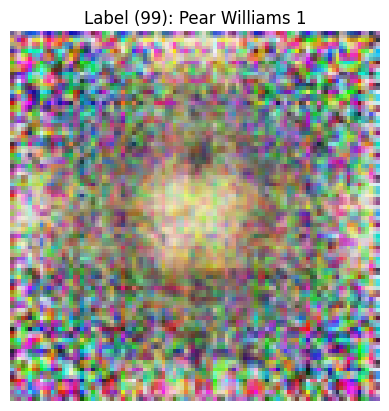

Epoch [52/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0016,                 RealAcc: 0.38,                 FakeAcc: 0.00,                 Epoch Time: 98.92
Expected: Fake, Predicted: Fake
correct_real: 53, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (126): Tamarillo 1  Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


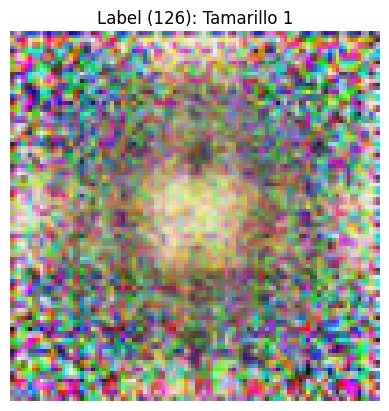

Data Collect: 0.36s                     Disc Time: 2.85s                     Gen Time: 2.57s
Expected: Fake, Predicted: Real
Label (43): Cucumber Ripe 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


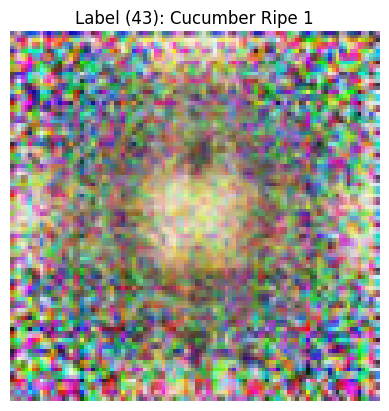

Epoch [53/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0016,                 RealAcc: 0.38,                 FakeAcc: 0.00,                 Epoch Time: 101.24
Expected: Fake, Predicted: Fake
correct_real: 54, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (68): Limes 1       Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


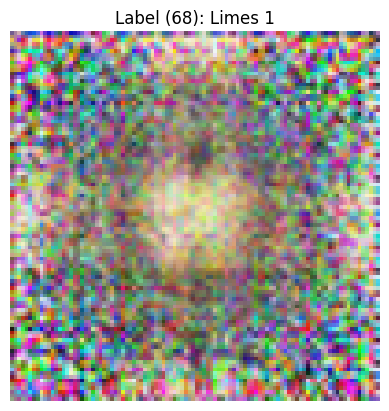

Data Collect: 0.33s                     Disc Time: 2.39s                     Gen Time: 1.73s
Expected: Fake, Predicted: Real
Label (103): Pepper Red 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.998-1.000


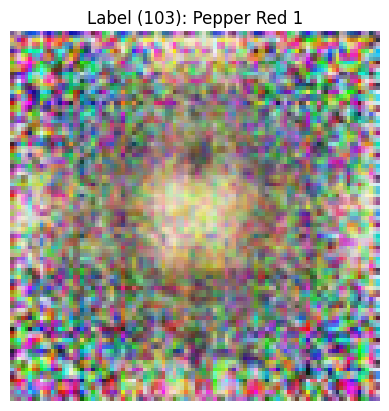

Epoch [54/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0016,                 RealAcc: 0.38,                 FakeAcc: 0.00,                 Epoch Time: 81.63
Expected: Real, Predicted: Real
correct_real: 52, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (61): Huckleberry 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.882-1.000


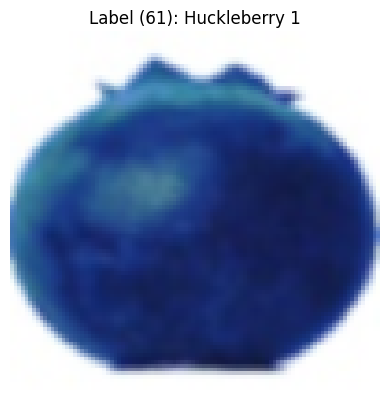

Data Collect: 0.45s                     Disc Time: 3.09s                     Gen Time: 2.11s
Expected: Fake, Predicted: Real
Label (36): Chestnut 1    Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


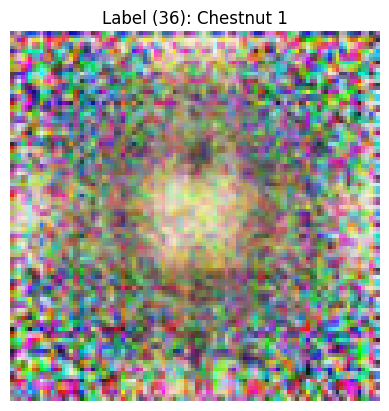

Epoch [55/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0015,                 RealAcc: 0.38,                 FakeAcc: 0.00,                 Epoch Time: 110.53
Expected: Fake, Predicted: Fake
correct_real: 54, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (118): Potato White 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


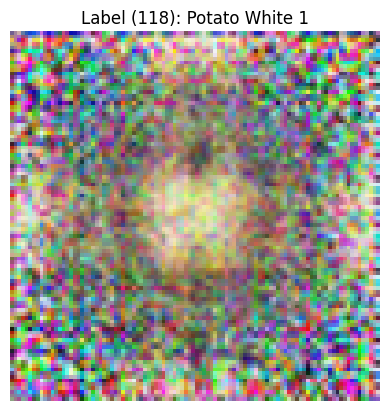

Data Collect: 0.53s                     Disc Time: 3.61s                     Gen Time: 3.11s
Expected: Fake, Predicted: Real
Label (97): Pear Red 1    Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


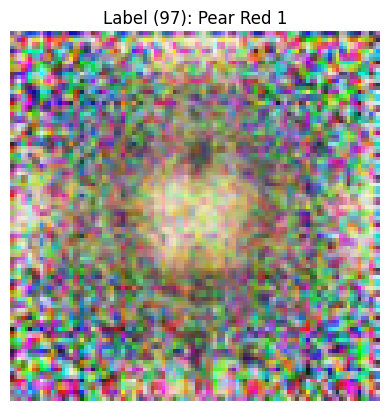

Epoch [56/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0016,                 RealAcc: 0.39,                 FakeAcc: 0.00,                 Epoch Time: 114.33
Expected: Real, Predicted: Real
correct_real: 51, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (11): Apple Red Delicious 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.616-1.000


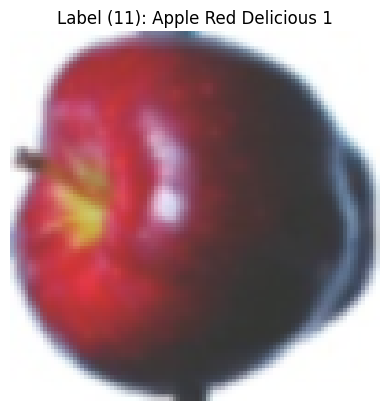

Data Collect: 0.49s                     Disc Time: 2.97s                     Gen Time: 2.73s
Expected: Fake, Predicted: Real
Label (102): Pepper Orange 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


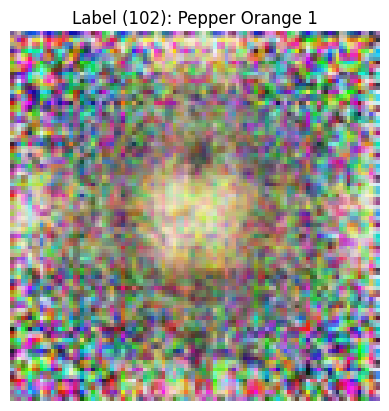

Epoch [57/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0015,                 RealAcc: 0.38,                 FakeAcc: 0.00,                 Epoch Time: 92.80
Expected: Fake, Predicted: Fake
correct_real: 52, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (39): Corn 1        Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


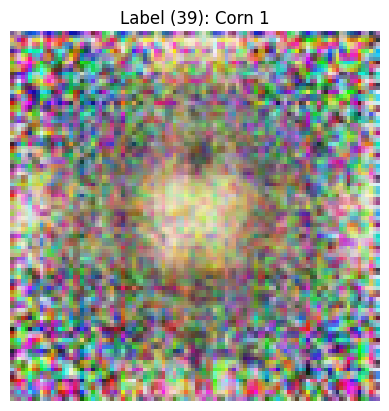

Data Collect: 0.34s                     Disc Time: 2.45s                     Gen Time: 1.76s
Expected: Fake, Predicted: Real
Label (47): Eggplant long 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


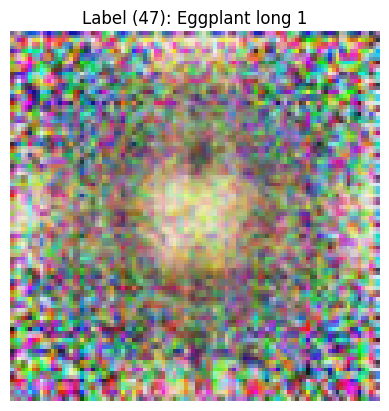

Epoch [58/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0015,                 RealAcc: 0.39,                 FakeAcc: 0.00,                 Epoch Time: 73.33
Expected: Real, Predicted: Real
correct_real: 54, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (33): Cherry Wax Black 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -1.000-1.000


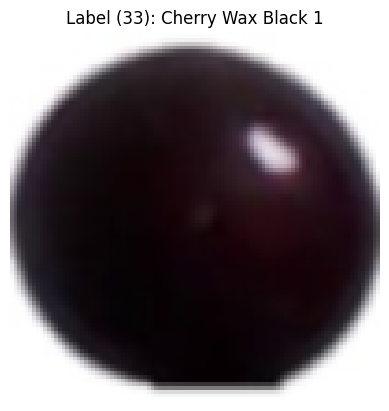

Data Collect: 0.36s                     Disc Time: 2.79s                     Gen Time: 2.00s
Expected: Fake, Predicted: Real
Label (13): Apple Red Yellow 2 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


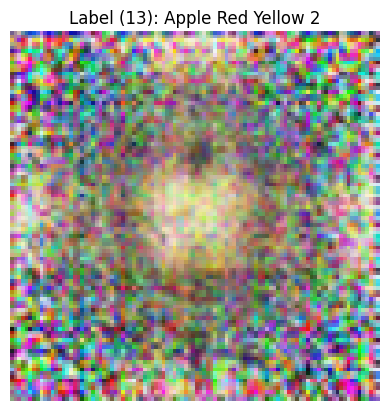

Epoch [59/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0015,                 RealAcc: 0.38,                 FakeAcc: 0.00,                 Epoch Time: 98.40
Expected: Fake, Predicted: Fake
correct_real: 51, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (48): Fig 1         Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


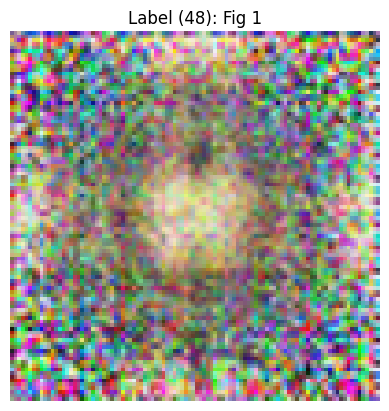

Data Collect: 0.52s                     Disc Time: 3.30s                     Gen Time: 2.23s
Expected: Fake, Predicted: Real
Label (55): Grape White 3 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


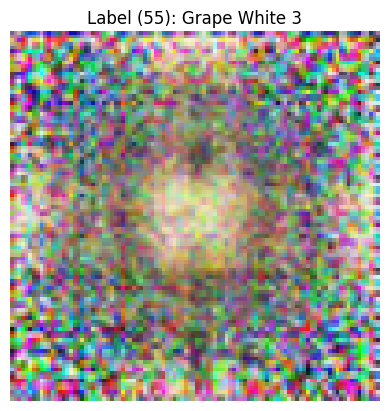

Epoch [60/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0015,                 RealAcc: 0.39,                 FakeAcc: 0.00,                 Epoch Time: 106.15
Expected: Real, Predicted: Real
correct_real: 53, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (137): Walnut 1     Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.608-1.000


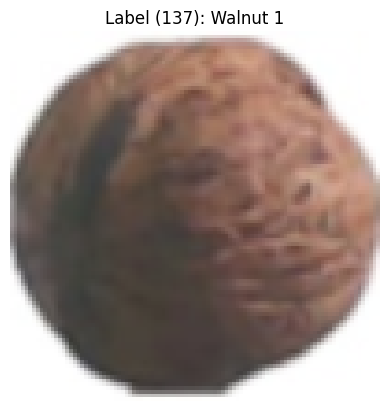

Data Collect: 0.47s                     Disc Time: 3.15s                     Gen Time: 2.44s
Expected: Fake, Predicted: Real
Label (7): Apple Pink Lady 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


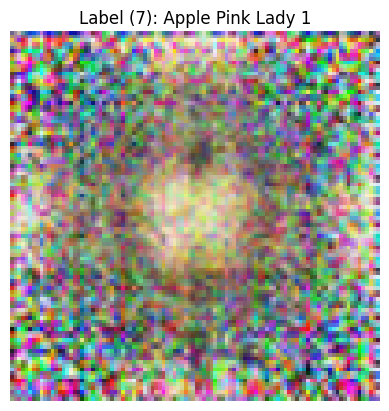

Epoch [61/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0015,                 RealAcc: 0.39,                 FakeAcc: 0.00,                 Epoch Time: 101.06
Expected: Fake, Predicted: Fake
correct_real: 56, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (12): Apple Red Yellow 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


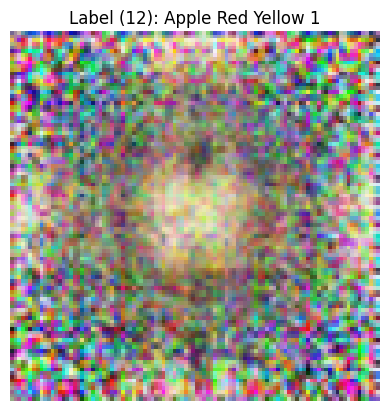

Data Collect: 0.38s                     Disc Time: 2.59s                     Gen Time: 1.69s
Expected: Fake, Predicted: Real
Label (72): Mango Red 1   Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


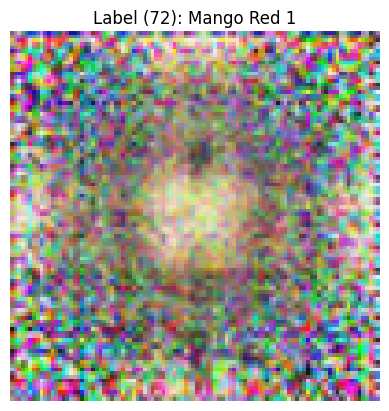

Epoch [62/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0014,                 RealAcc: 0.39,                 FakeAcc: 0.00,                 Epoch Time: 108.59
Expected: Fake, Predicted: Fake
correct_real: 52, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (88): Peach 2       Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


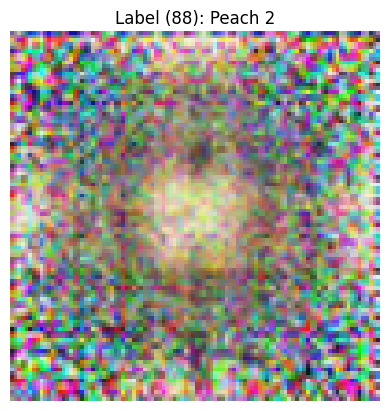

Data Collect: 0.55s                     Disc Time: 4.03s                     Gen Time: 3.08s
Expected: Fake, Predicted: Real
Label (19): Banana Lady Finger 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


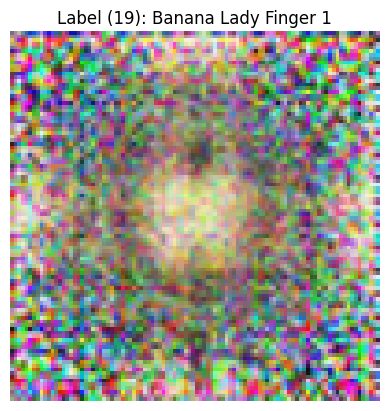

Epoch [63/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0014,                 RealAcc: 0.39,                 FakeAcc: 0.00,                 Epoch Time: 101.48
Expected: Real, Predicted: Real
correct_real: 55, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (11): Apple Red Delicious 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.608-1.000


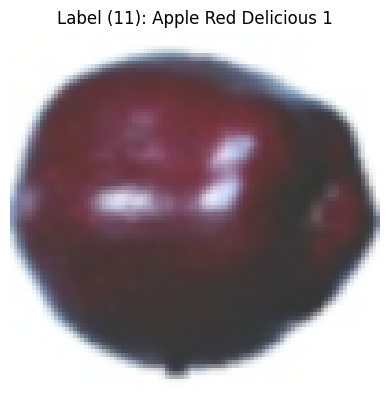

Data Collect: 0.53s                     Disc Time: 3.01s                     Gen Time: 2.19s
Expected: Fake, Predicted: Real
Label (37): Clementine 1  Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


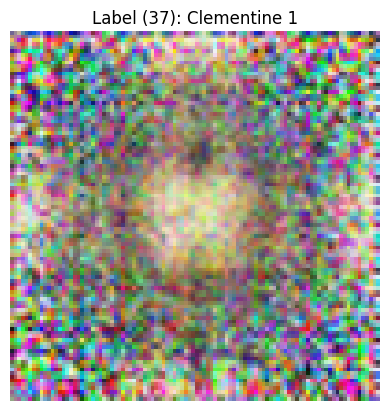

Epoch [64/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0014,                 RealAcc: 0.39,                 FakeAcc: 0.00,                 Epoch Time: 85.30
Expected: Real, Predicted: Real
correct_real: 50, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (41): Cucumber 1    Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.820-1.000


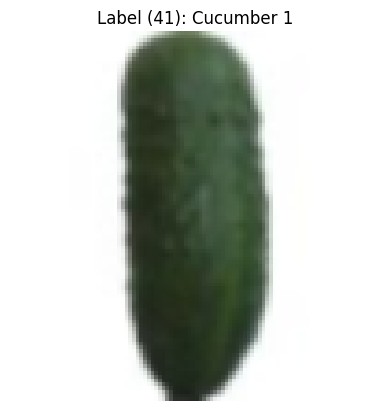

Data Collect: 0.35s                     Disc Time: 2.58s                     Gen Time: 1.81s
Expected: Fake, Predicted: Real
Label (92): Pear 3        Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


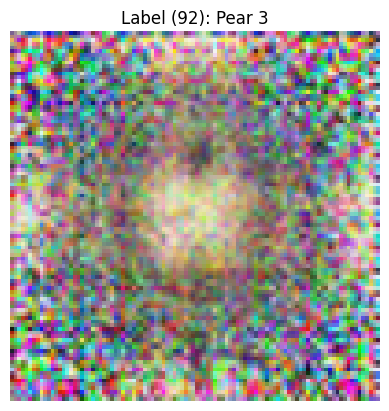

Epoch [65/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0014,                 RealAcc: 0.39,                 FakeAcc: 0.00,                 Epoch Time: 81.63
Expected: Fake, Predicted: Fake
correct_real: 55, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (45): Dates 1       Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


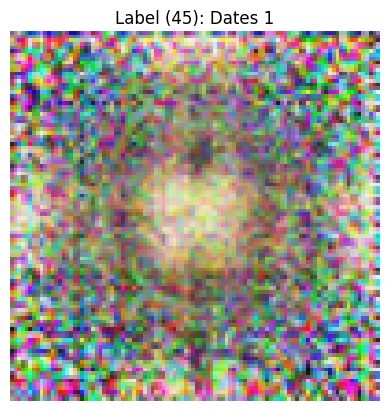

Data Collect: 0.36s                     Disc Time: 2.29s                     Gen Time: 1.71s
Expected: Fake, Predicted: Real
Label (117): Potato Sweet 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


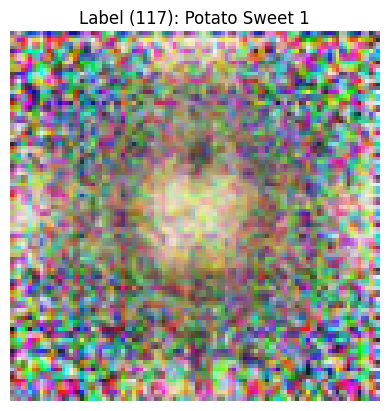

Epoch [66/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0014,                 RealAcc: 0.39,                 FakeAcc: 0.00,                 Epoch Time: 80.61
Expected: Fake, Predicted: Fake
correct_real: 53, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (99): Pear Williams 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


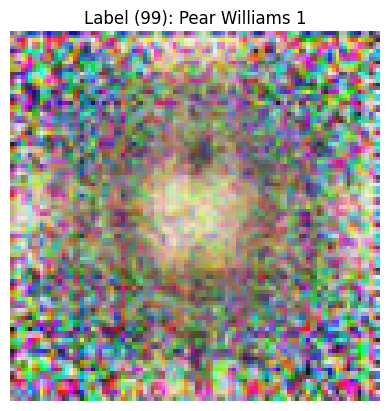

Data Collect: 0.48s                     Disc Time: 3.04s                     Gen Time: 2.07s
Expected: Fake, Predicted: Real
Label (32): Cherry Rainier 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


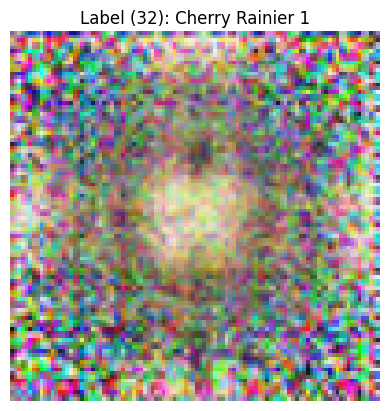

Epoch [67/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0014,                 RealAcc: 0.39,                 FakeAcc: 0.00,                 Epoch Time: 95.05
Expected: Fake, Predicted: Fake
correct_real: 56, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (37): Clementine 1  Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


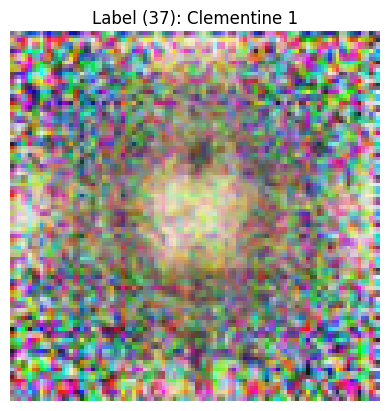

Data Collect: 0.42s                     Disc Time: 2.83s                     Gen Time: 2.20s
Expected: Fake, Predicted: Real
Label (84): Orange 1      Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


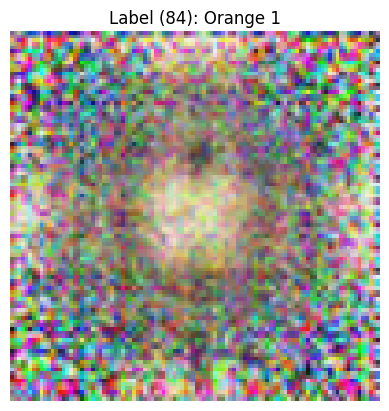

Epoch [68/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0013,                 RealAcc: 0.39,                 FakeAcc: 0.00,                 Epoch Time: 107.03
Expected: Fake, Predicted: Fake
correct_real: 54, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (55): Grape White 3 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


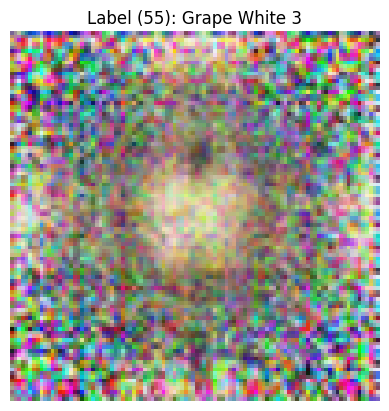

Data Collect: 0.51s                     Disc Time: 2.97s                     Gen Time: 2.57s
Expected: Fake, Predicted: Real
Label (117): Potato Sweet 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


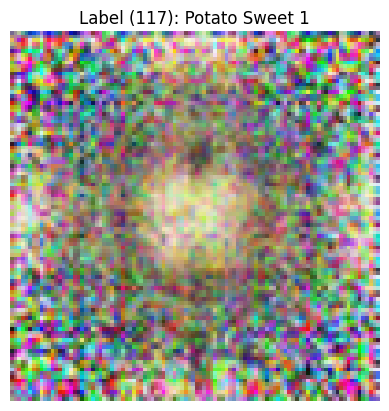

Epoch [69/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0013,                 RealAcc: 0.40,                 FakeAcc: 0.00,                 Epoch Time: 103.20
Expected: Real, Predicted: Real
correct_real: 53, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (140): Zucchini dark 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.835-1.000


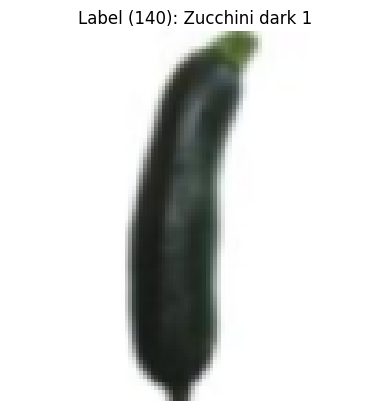

Data Collect: 0.45s                     Disc Time: 2.62s                     Gen Time: 2.19s
Expected: Fake, Predicted: Real
Label (57): Grapefruit Pink 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


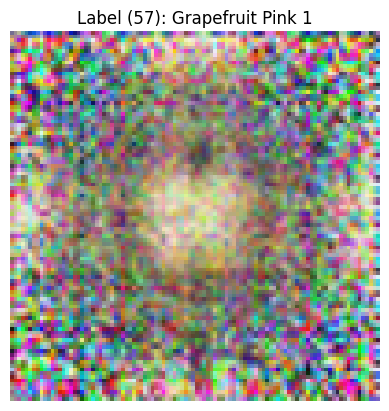

Epoch [70/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0013,                 RealAcc: 0.39,                 FakeAcc: 0.00,                 Epoch Time: 79.98
Expected: Fake, Predicted: Fake
correct_real: 51, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (67): Lemon Meyer 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


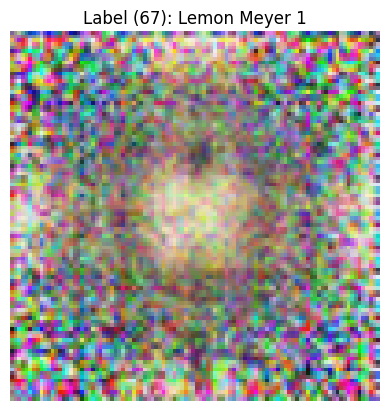

Data Collect: 0.25s                     Disc Time: 1.78s                     Gen Time: 1.12s
Expected: Fake, Predicted: Real
Label (138): Watermelon 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


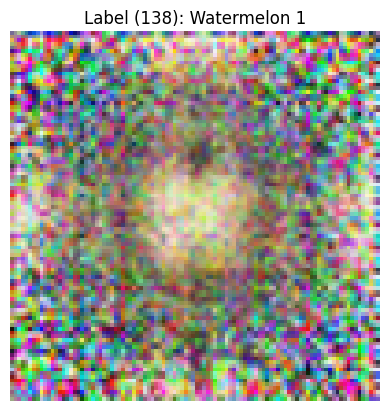

Epoch [71/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0013,                 RealAcc: 0.39,                 FakeAcc: 0.00,                 Epoch Time: 59.66
Expected: Fake, Predicted: Fake
correct_real: 51, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (52): Grape Pink 1  Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


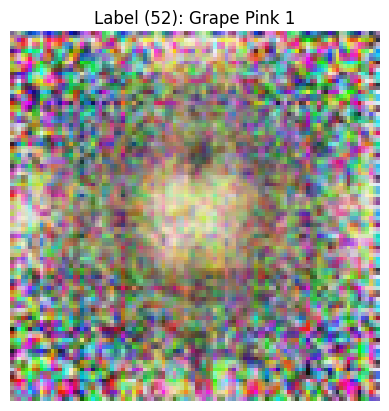

Data Collect: 0.23s                     Disc Time: 1.55s                     Gen Time: 1.13s
Expected: Fake, Predicted: Real
Label (68): Limes 1       Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -1.000-1.000


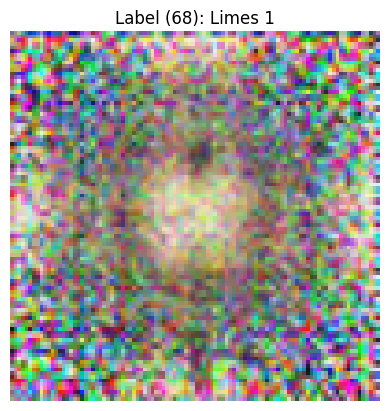

Epoch [72/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0013,                 RealAcc: 0.39,                 FakeAcc: 0.00,                 Epoch Time: 53.92
Expected: Real, Predicted: Real
correct_real: 58, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (24): Cactus fruit 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.835-1.000


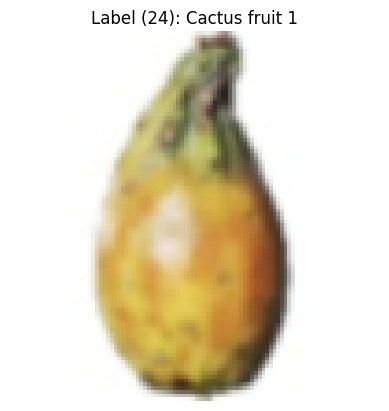

Data Collect: 0.25s                     Disc Time: 2.76s                     Gen Time: 2.21s
Expected: Fake, Predicted: Real
Label (0): Apple 6        Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


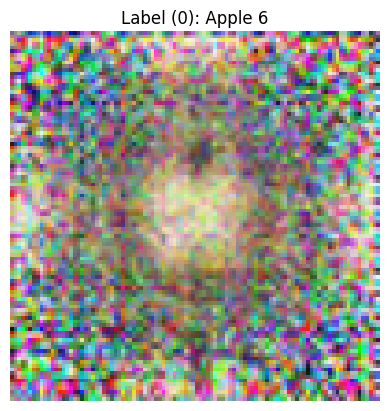

Epoch [73/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0013,                 RealAcc: 0.39,                 FakeAcc: 0.00,                 Epoch Time: 96.85
Expected: Fake, Predicted: Fake
correct_real: 55, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (109): Pitahaya Red 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


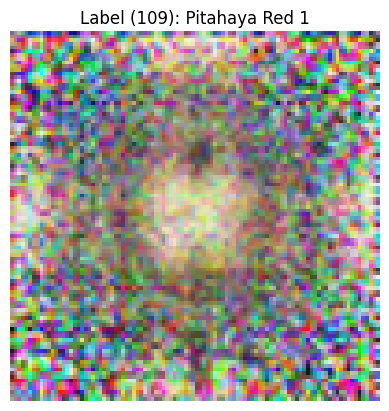

Data Collect: 0.42s                     Disc Time: 2.38s                     Gen Time: 1.94s
Expected: Fake, Predicted: Real
Label (69): Lychee 1      Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


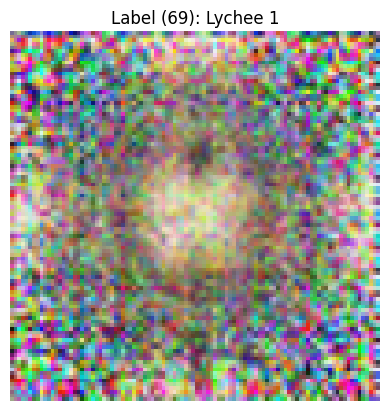

Epoch [74/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0013,                 RealAcc: 0.40,                 FakeAcc: 0.00,                 Epoch Time: 59.71
Expected: Real, Predicted: Real
correct_real: 50, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (119): Quince 1     Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.969-1.000


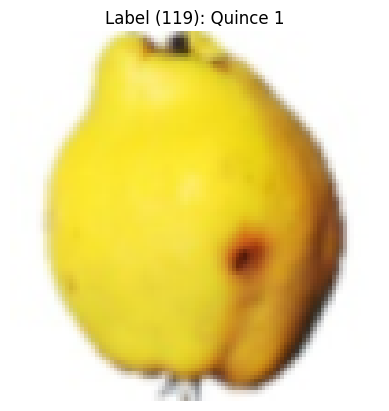

Data Collect: 0.22s                     Disc Time: 1.55s                     Gen Time: 1.06s
Expected: Fake, Predicted: Real
Label (119): Quince 1     Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


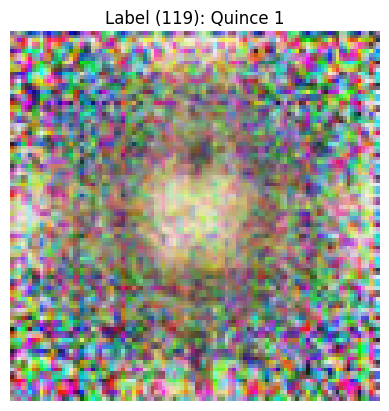

Epoch [75/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0012,                 RealAcc: 0.40,                 FakeAcc: 0.00,                 Epoch Time: 50.73
Expected: Real, Predicted: Real
correct_real: 55, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (117): Potato Sweet 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.741-1.000


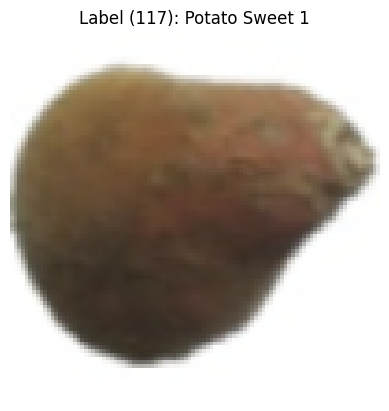

Data Collect: 0.23s                     Disc Time: 1.66s                     Gen Time: 1.02s
Expected: Fake, Predicted: Real
Label (14): Apple hit 1   Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


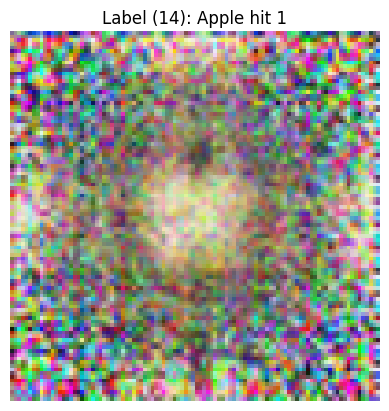

Epoch [76/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0012,                 RealAcc: 0.39,                 FakeAcc: 0.00,                 Epoch Time: 58.51
Expected: Fake, Predicted: Fake
correct_real: 56, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (87): Peach 1       Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


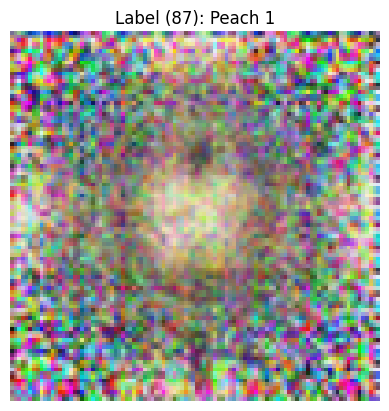

Data Collect: 0.25s                     Disc Time: 2.75s                     Gen Time: 1.54s
Expected: Fake, Predicted: Real
Label (132): Tomato Cherry Red 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


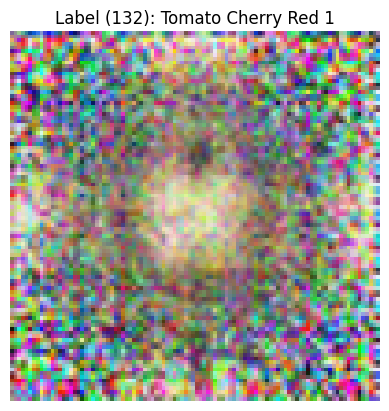

Epoch [77/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0012,                 RealAcc: 0.40,                 FakeAcc: 0.00,                 Epoch Time: 61.51
Expected: Fake, Predicted: Fake
correct_real: 51, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (102): Pepper Orange 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


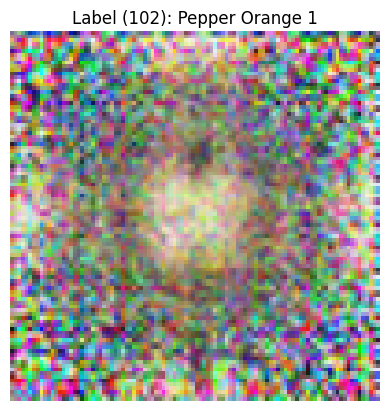

Data Collect: 0.25s                     Disc Time: 1.34s                     Gen Time: 1.03s
Expected: Fake, Predicted: Real
Label (95): Pear Kaiser 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


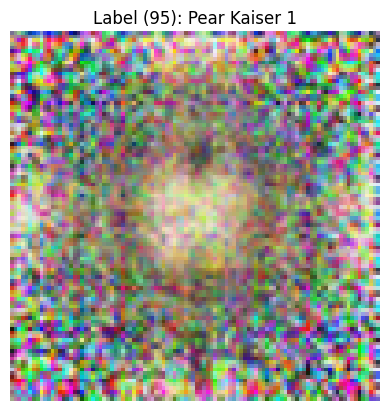

Epoch [78/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0012,                 RealAcc: 0.39,                 FakeAcc: 0.00,                 Epoch Time: 50.38
Expected: Fake, Predicted: Fake
correct_real: 56, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (46): Eggplant 1    Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -1.000-1.000


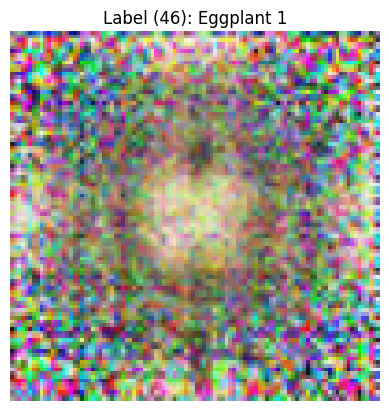

Data Collect: 0.24s                     Disc Time: 1.40s                     Gen Time: 1.08s
Expected: Fake, Predicted: Real
Label (20): Banana Red 1  Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


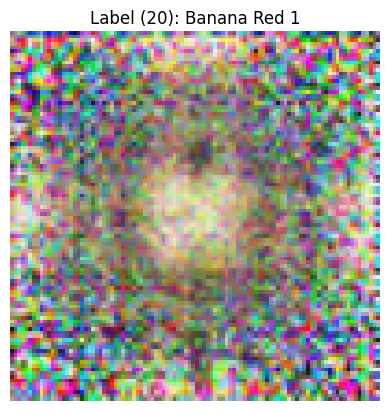

Epoch [79/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0012,                 RealAcc: 0.40,                 FakeAcc: 0.00,                 Epoch Time: 50.00
Expected: Real, Predicted: Real
correct_real: 53, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (9): Apple Red 2    Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -1.000-1.000


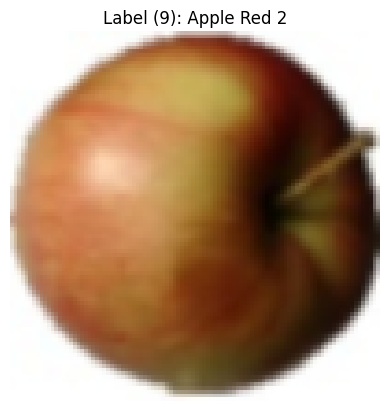

Data Collect: 0.25s                     Disc Time: 1.34s                     Gen Time: 1.06s
Expected: Fake, Predicted: Real
Label (87): Peach 1       Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


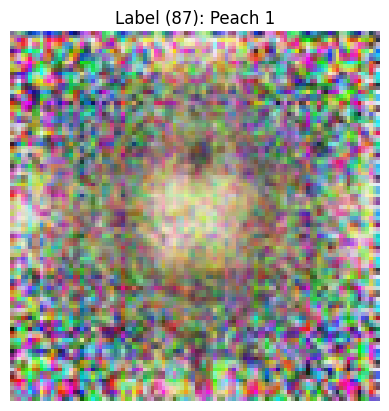

Epoch [80/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0012,                 RealAcc: 0.40,                 FakeAcc: 0.00,                 Epoch Time: 49.83
Expected: Real, Predicted: Real
correct_real: 52, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (127): Tangelo 1    Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.788-1.000


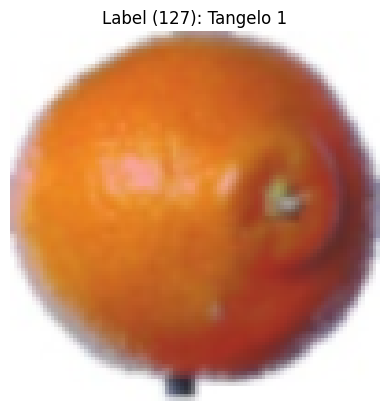

Data Collect: 0.22s                     Disc Time: 1.33s                     Gen Time: 1.02s
Expected: Fake, Predicted: Real
Label (138): Watermelon 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -1.000-1.000


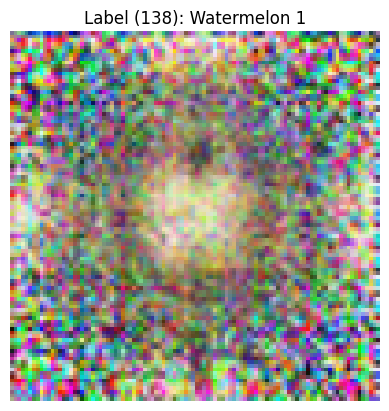

Epoch [81/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0012,                 RealAcc: 0.40,                 FakeAcc: 0.00,                 Epoch Time: 49.69
Expected: Fake, Predicted: Fake
correct_real: 55, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (102): Pepper Orange 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


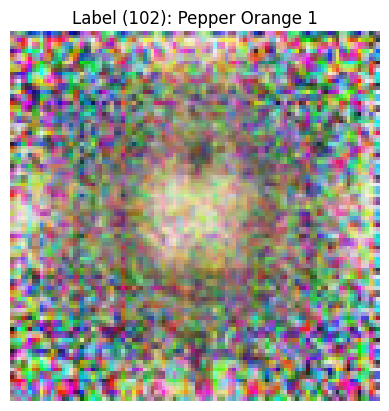

Data Collect: 0.27s                     Disc Time: 1.36s                     Gen Time: 0.99s
Expected: Fake, Predicted: Real
Label (30): Cherry 1      Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -1.000-1.000


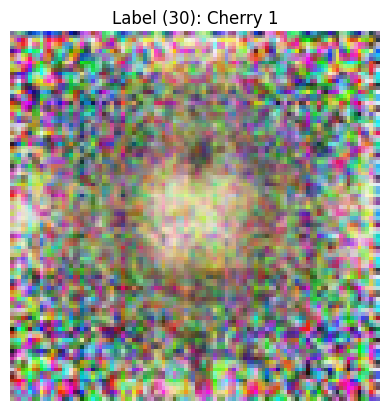

Epoch [82/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0012,                 RealAcc: 0.40,                 FakeAcc: 0.00,                 Epoch Time: 50.05
Expected: Real, Predicted: Real
correct_real: 52, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (63): Kiwi 1        Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.890-1.000


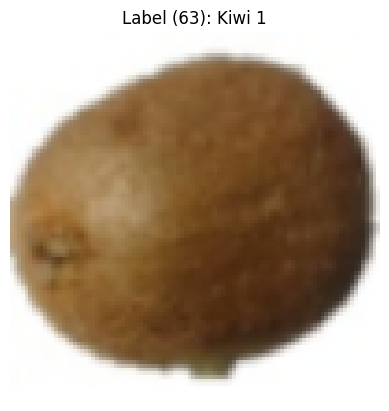

Data Collect: 0.23s                     Disc Time: 1.39s                     Gen Time: 0.97s
Expected: Fake, Predicted: Real
Label (11): Apple Red Delicious 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


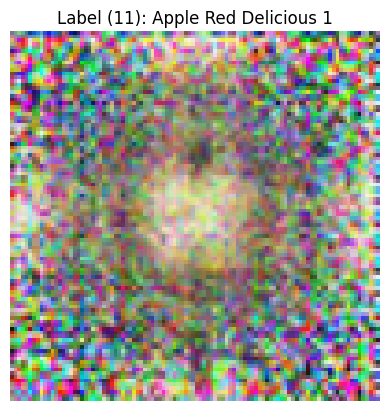

Epoch [83/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0012,                 RealAcc: 0.40,                 FakeAcc: 0.00,                 Epoch Time: 49.80
Expected: Fake, Predicted: Fake
correct_real: 54, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (36): Chestnut 1    Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


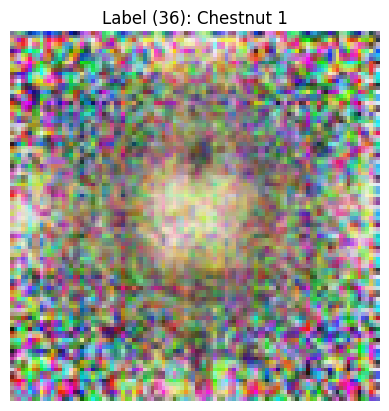

Data Collect: 0.25s                     Disc Time: 1.59s                     Gen Time: 1.10s
Expected: Fake, Predicted: Real
Label (89): Peach Flat 1  Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


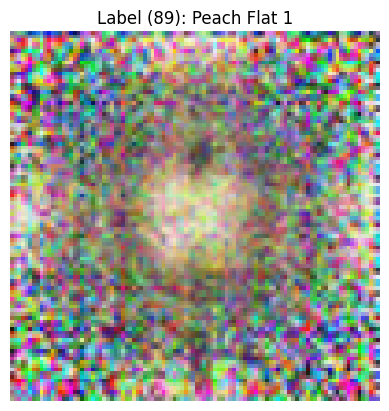

Epoch [84/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0012,                 RealAcc: 0.40,                 FakeAcc: 0.00,                 Epoch Time: 94.48
Expected: Real, Predicted: Real
correct_real: 52, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (106): Physalis with Husk 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.835-1.000


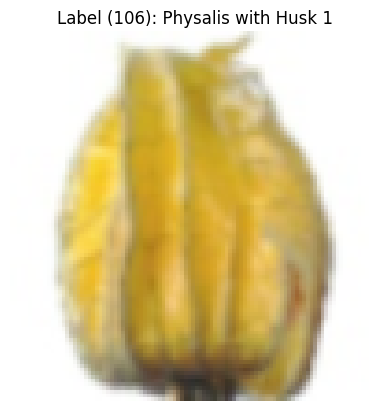

Data Collect: 0.22s                     Disc Time: 1.52s                     Gen Time: 0.96s
Expected: Fake, Predicted: Real
Label (122): Redcurrant 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -1.000-1.000


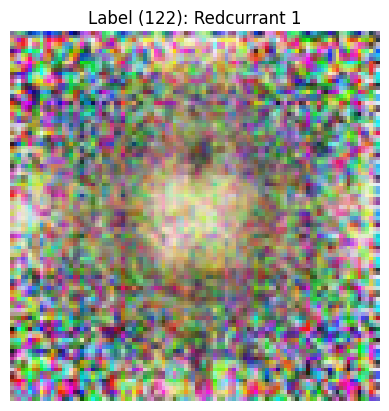

Epoch [85/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0012,                 RealAcc: 0.40,                 FakeAcc: 0.00,                 Epoch Time: 52.20
Expected: Fake, Predicted: Fake
correct_real: 53, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (131): Tomato 4     Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -1.000-1.000


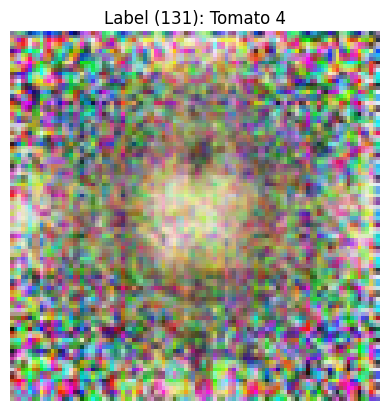

Data Collect: 0.28s                     Disc Time: 1.77s                     Gen Time: 1.07s
Expected: Fake, Predicted: Real
Label (15): Apricot 1     Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


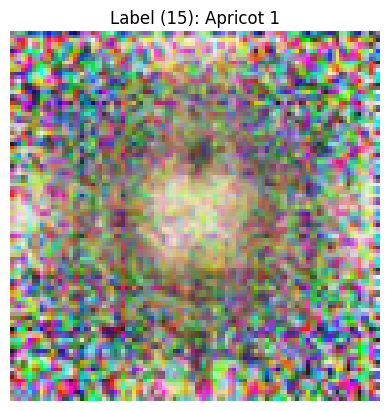

Epoch [86/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0011,                 RealAcc: 0.40,                 FakeAcc: 0.00,                 Epoch Time: 51.11
Expected: Real, Predicted: Real
correct_real: 55, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (114): Pomelo Sweetie 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.882-1.000


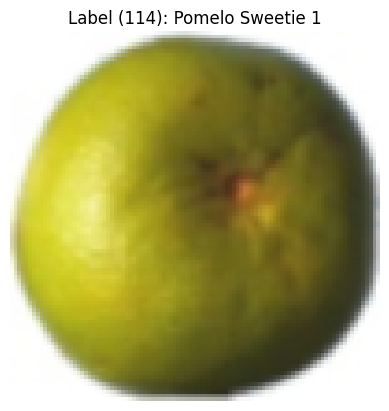

Data Collect: 0.25s                     Disc Time: 1.75s                     Gen Time: 1.06s
Expected: Fake, Predicted: Real
Label (69): Lychee 1      Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -1.000-1.000


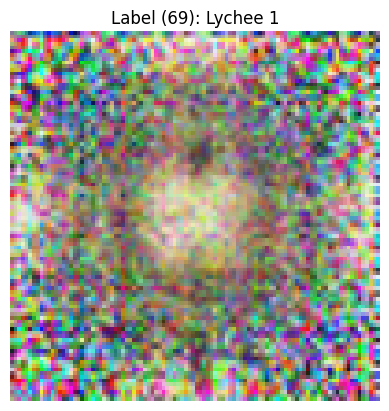

Epoch [87/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0011,                 RealAcc: 0.40,                 FakeAcc: 0.00,                 Epoch Time: 61.76
Expected: Fake, Predicted: Fake
correct_real: 52, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (110): Plum 1       Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


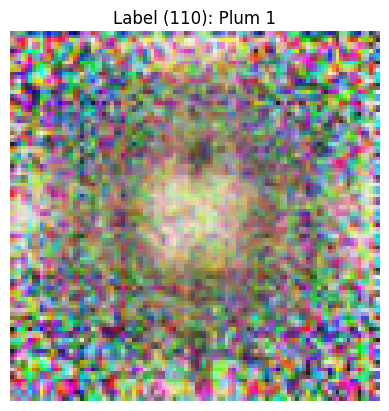

Data Collect: 0.24s                     Disc Time: 1.41s                     Gen Time: 1.13s
Expected: Fake, Predicted: Real
Label (114): Pomelo Sweetie 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


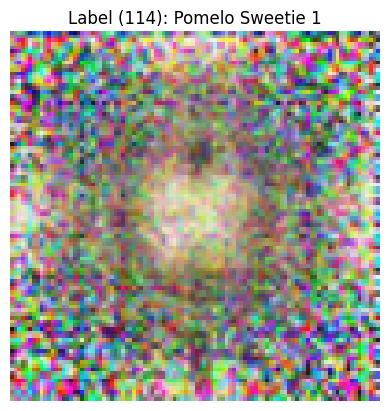

Epoch [88/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0011,                 RealAcc: 0.40,                 FakeAcc: 0.00,                 Epoch Time: 49.92
Expected: Real, Predicted: Real
correct_real: 55, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (106): Physalis with Husk 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.835-1.000


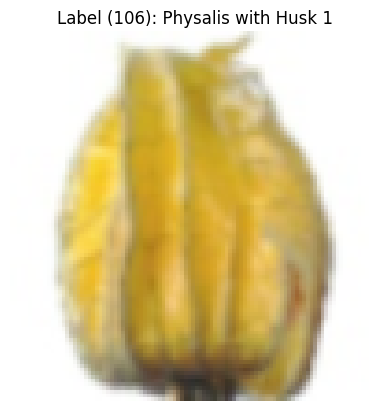

Data Collect: 0.24s                     Disc Time: 1.55s                     Gen Time: 1.46s
Expected: Fake, Predicted: Real
Label (111): Plum 2       Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


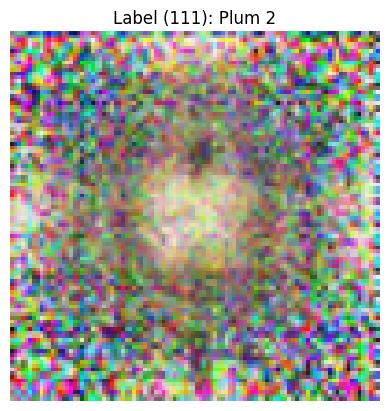

Epoch [89/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0011,                 RealAcc: 0.40,                 FakeAcc: 0.00,                 Epoch Time: 50.86
Expected: Real, Predicted: Real
correct_real: 54, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (89): Peach Flat 1  Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.992-1.000


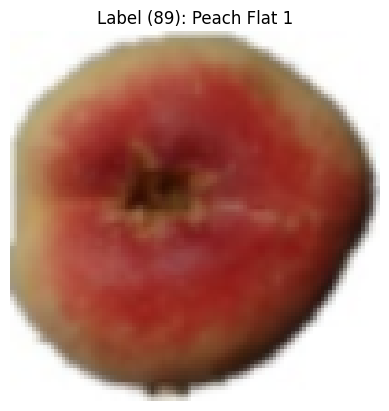

Data Collect: 0.23s                     Disc Time: 1.36s                     Gen Time: 0.97s
Expected: Fake, Predicted: Real
Label (27): Carambula 1   Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -1.000-1.000


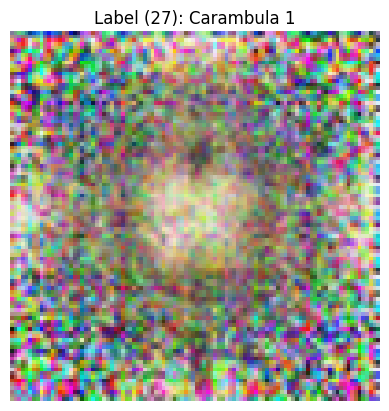

Epoch [90/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0011,                 RealAcc: 0.40,                 FakeAcc: 0.00,                 Epoch Time: 81.02
Expected: Fake, Predicted: Fake
correct_real: 53, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (104): Pepper Yellow 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -1.000-1.000


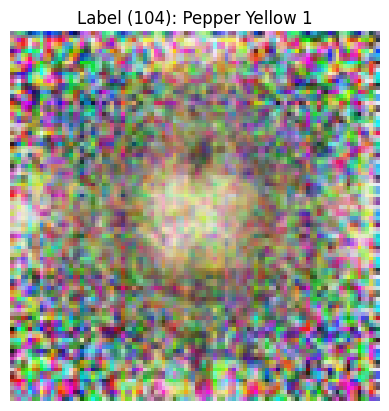

Data Collect: 0.37s                     Disc Time: 2.29s                     Gen Time: 1.66s
Expected: Fake, Predicted: Real
Label (65): Kumquats 1    Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


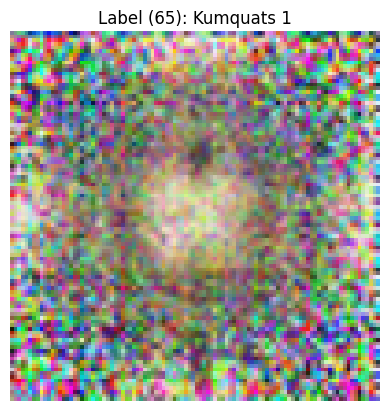

Epoch [91/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0011,                 RealAcc: 0.40,                 FakeAcc: 0.00,                 Epoch Time: 106.64
Expected: Real, Predicted: Real
correct_real: 54, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (84): Orange 1      Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -1.000-1.000


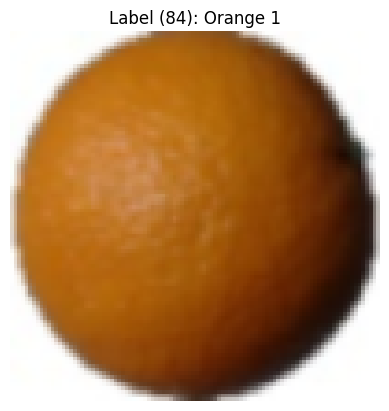

Data Collect: 0.57s                     Disc Time: 3.26s                     Gen Time: 2.97s
Expected: Fake, Predicted: Real
Label (50): Granadilla 1  Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -1.000-1.000


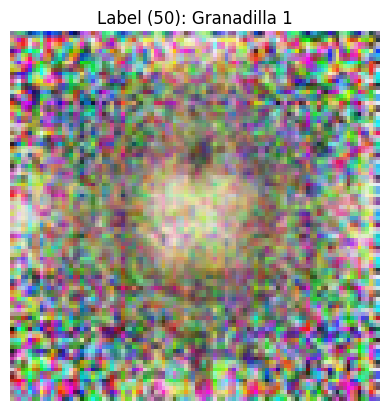

Epoch [92/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0011,                 RealAcc: 0.40,                 FakeAcc: 0.00,                 Epoch Time: 126.85
Expected: Real, Predicted: Real
correct_real: 53, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (18): Banana 1      Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.875-1.000


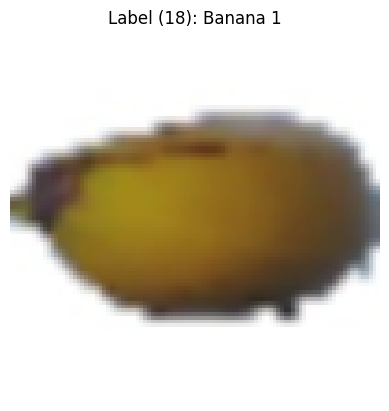

Data Collect: 0.61s                     Disc Time: 4.11s                     Gen Time: 2.88s
Expected: Fake, Predicted: Real
Label (100): Pepino 1     Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


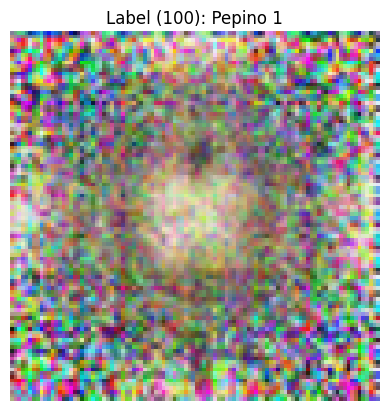

Epoch [93/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0011,                 RealAcc: 0.40,                 FakeAcc: 0.00,                 Epoch Time: 90.43
Expected: Real, Predicted: Real
correct_real: 54, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (121): Raspberry 1  Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.867-1.000


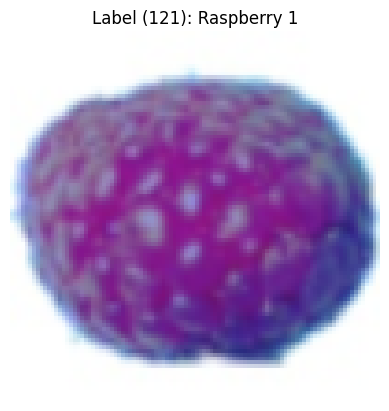

Data Collect: 0.33s                     Disc Time: 2.34s                     Gen Time: 1.82s
Expected: Fake, Predicted: Real
Label (124): Strawberry 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -1.000-1.000


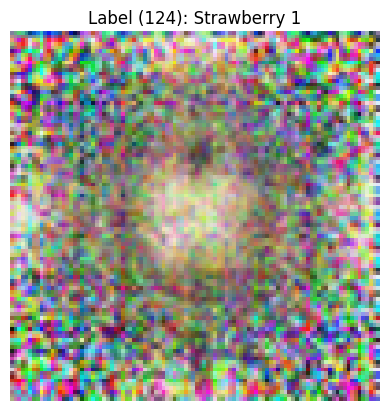

Epoch [94/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0011,                 RealAcc: 0.40,                 FakeAcc: 0.00,                 Epoch Time: 117.84
Expected: Real, Predicted: Real
correct_real: 55, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (102): Pepper Orange 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.969-1.000


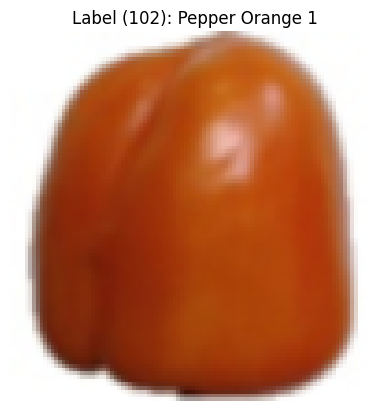

Data Collect: 0.39s                     Disc Time: 2.41s                     Gen Time: 1.43s
Expected: Fake, Predicted: Real
Label (69): Lychee 1      Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


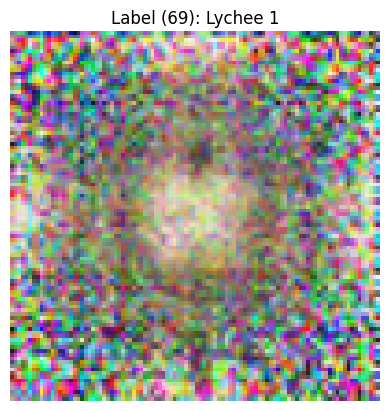

Epoch [95/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0011,                 RealAcc: 0.40,                 FakeAcc: 0.00,                 Epoch Time: 78.77
Expected: Real, Predicted: Real
correct_real: 57, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (99): Pear Williams 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.780-1.000


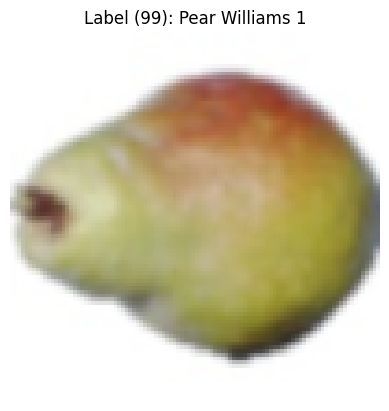

Data Collect: 0.32s                     Disc Time: 2.26s                     Gen Time: 1.90s
Expected: Fake, Predicted: Real
Label (74): Maracuja 1    Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -1.000-1.000


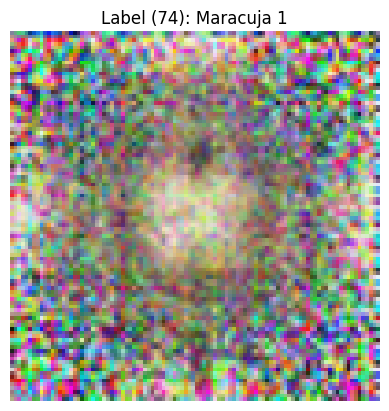

Epoch [96/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0011,                 RealAcc: 0.40,                 FakeAcc: 0.00,                 Epoch Time: 97.17
Expected: Real, Predicted: Real
correct_real: 59, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (134): Tomato Maroon 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.671-1.000


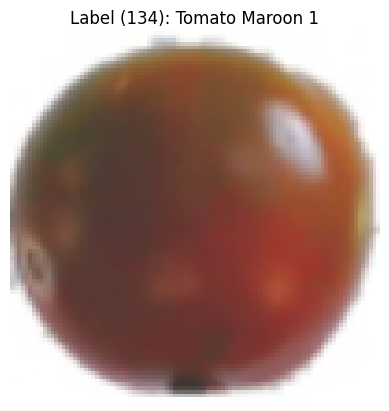

Data Collect: 0.40s                     Disc Time: 3.53s                     Gen Time: 2.38s
Expected: Fake, Predicted: Real
Label (66): Lemon 1       Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -0.999-1.000


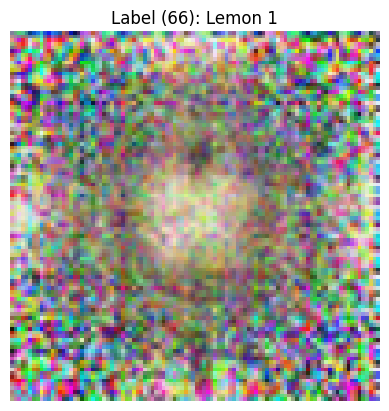

Epoch [97/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0010,                 RealAcc: 0.40,                 FakeAcc: 0.00,                 Epoch Time: 81.25
Expected: Fake, Predicted: Fake
correct_real: 52, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (25): Cantaloupe 1  Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -1.000-1.000


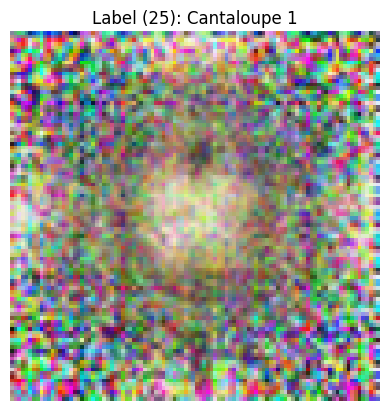

Data Collect: 0.38s                     Disc Time: 2.86s                     Gen Time: 1.71s
Expected: Fake, Predicted: Real
Label (88): Peach 2       Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -1.000-1.000


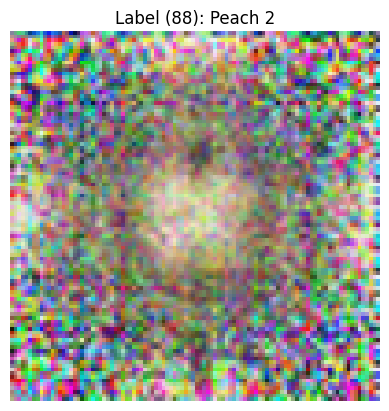

Epoch [98/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0010,                 RealAcc: 0.40,                 FakeAcc: 0.00,                 Epoch Time: 120.76
Expected: Fake, Predicted: Fake
correct_real: 55, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (35): Cherry Wax Yellow 1 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -1.000-1.000


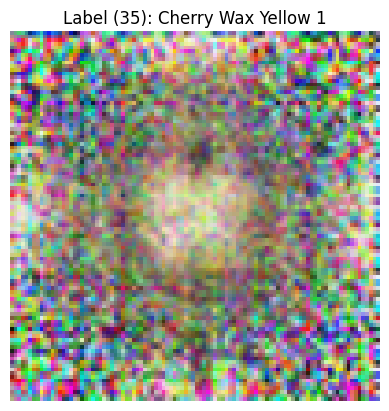

Data Collect: 0.58s                     Disc Time: 4.03s                     Gen Time: 2.32s
Expected: Fake, Predicted: Real
Label (98): Pear Stone 1  Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -1.000-1.000


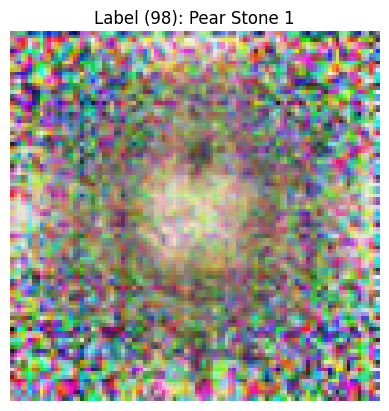

Epoch [99/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0010,                 RealAcc: 0.40,                 FakeAcc: 0.00,                 Epoch Time: 110.45
Expected: Fake, Predicted: Fake
correct_real: 56, correct_fake: 0
combined_embed            Tensor Shape: torch.Size([300]), Min-Max: 0.000-140.000
Label (98): Pear Stone 1  Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -1.000-1.000


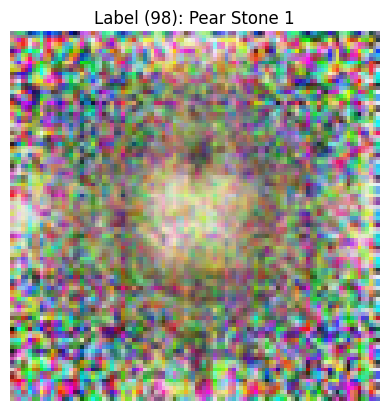

Data Collect: 0.62s                     Disc Time: 3.28s                     Gen Time: 3.24s
Expected: Fake, Predicted: Real
Label (54): Grape White 2 Tensor Shape: torch.Size([3, 64, 64]), Min-Max: -1.000-1.000


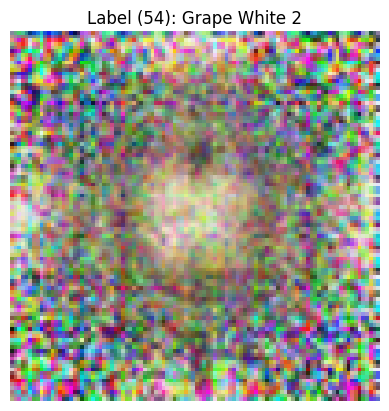

Epoch [100/100],                 DiscLoss: 0.0000,                 GenLoss: 0.0010,                 RealAcc: 0.41,                 FakeAcc: 0.00,                 Epoch Time: 112.83
Total Training Time: 8509.87s
generator GAN data saved to disk
discriminator GAN data saved to disk


In [507]:
# Train and Test
train_loss_gen, train_loss_disc, train_acc_real, train_acc_fake, generator, discriminator = \
    train_cnn_gan(
        generator=generator_model.to(device), 
        discriminator=discriminator_model.to(device), 
        gen_opt=optimizer_g,
        disc_opt=optimizer_d,
        loss_func=loss_func,
        train_loader=train_loader, 
        latent_dim=latent_dim,
        device=device,
        num_epochs=num_epochs, 
        )


# Save model, accuracy, and loss per epoch
model_description = "gan_gen"
full_path = f'{out_dir}/{model_description}'
np.save(f'{full_path}-train_loss.npy', np.array(train_loss_gen))
torch.save(generator.state_dict(), f'{full_path}.pt')
print(f'generator GAN data saved to disk')

model_description = "gan_disc"
full_path = f'{out_dir}/{model_description}'
np.save(f'{full_path}-train_loss.npy', np.array(train_loss_disc))
np.save(f'{full_path}-train_acc_real.npy', np.array(train_acc_real))
np.save(f'{full_path}-train_acc_fake.npy', np.array(train_acc_fake))
torch.save(discriminator.state_dict(), f'{full_path}.pt')
print(f'discriminator GAN data saved to disk')

#### Other

In [ ]:
def calculate_output_shape(input_size, kernel_size, stride, padding):
    assert input_size > 0,  f'input_size not valid'
    assert padding >= 0,    f'padding not valid'
    return (input_size + 2 * padding - kernel_size) // stride + 1

# Input parameters
input_size = 8
kernel_size = 8
stride = 2
padding = 0

# Calculate output size
output_size = calculate_output_shape(input_size, kernel_size, stride, padding)
print(f"Output size: {output_size}")

### Plot convergence

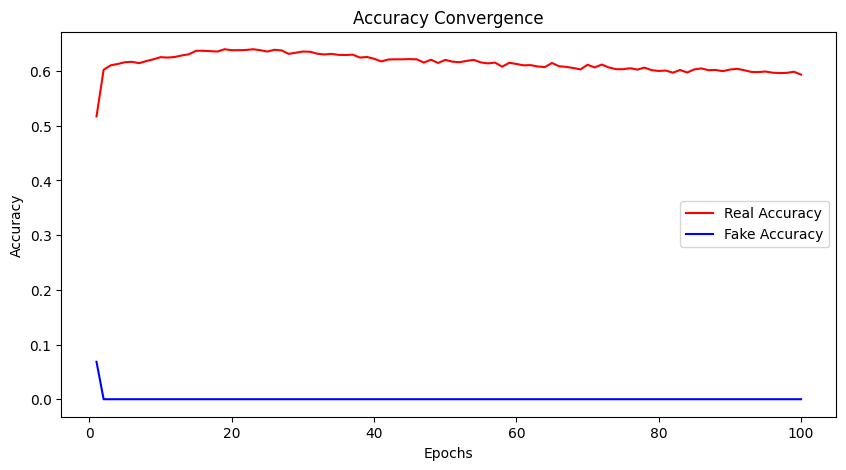

In [539]:
model_description = "gan_disc"
full_path = f'{out_dir}/{model_description}'

train_acc_real = np.load(f'{full_path}-train_acc_real.npy')
train_acc_fake = np.load(f'{full_path}-train_acc_fake.npy')

def plot_convergence(acc_real, acc_fake, save_path=None):
    epochs = range(1, len(acc_real) + 1)
    acc_fake = 1-acc_fake
    # acc_avg = (acc_real+acc_fake)/2

    plt.figure(figsize=(10, 5))
    plt.plot(epochs, 1-acc_real, label="Real Accuracy", color="red")
    plt.plot(epochs, 1-acc_fake, label="Fake Accuracy", color="blue")
    
    plt.title("Accuracy Convergence")
    plt.xlabel(  "Epochs")
    plt.ylabel("Accuracy")
    plt.legend()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Convergence plot saved to: {save_path}")
    
    plt.show()

plot_convergence(train_acc_real, train_acc_fake)